<h1>Table of Contents<span class="tocSkip"></span></h1>


# Introduction
<hr style = "border:2px solid black" ></hr>


**What?** Imbalanced binary classification




# Import modules
<hr style = "border:2px solid black" ></hr>

In [1]:
# Data wrangling
import pandas as pd
from sklearn.preprocessing import StandardScaler
from scipy import stats
from scipy.stats import norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
from scipy.stats import spearmanr, kendalltau
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
import numpy as np
from collections import Counter
from functools import reduce
from sklearn.pipeline import make_pipeline

# Visualisation
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

# Rendering
from IPython.display import display as dsp

# Modelling
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve, roc_curve, det_curve
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, StratifiedKFold
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.neighbors import KNeighborsClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import matthews_corrcoef
from xgboost import XGBClassifier
from sklearn.metrics import make_scorer

# Getting rid of the warning messages
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index



- Modules versions for reproducibility.  



In [2]:
%load_ext watermark
%watermark -p pandas,sklearn,matplotlib,seaborn,numpy,catboost,xgboost,lightgbm

pandas    : 1.4.0
sklearn   : 0.0
matplotlib: 3.5.1
seaborn   : 0.11.2
numpy     : 1.21.5
catboost  : 1.0.4
xgboost   : 1.5.2
lightgbm  : 3.3.2



# EDA (Exploratory Data Analysis)
<hr style = "border:2px solid black" ></hr>


- **Domain knowledge**: unknown.
 
- There are 13 features.

- There is one target referred to as **`Target`**.



## Read-in data


- In this section we are going to read-in the data and perfom the following steps:  
    - Separate features from target.
    - Run a quick know-your-data analysis from a very high-level stand point.



In [3]:
csv_path = "../../../DATASETS/unbalanced_binary_classes.csv"
pdf = pd.read_csv(csv_path)

In [4]:
pdf.head(5)

,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Target
0,0.55,9.5,B,0.99740,NaN,32.0,10.0,1.90,0.58,3.13,0.22,0.080,9.0,0
1,0.32,12.7,A,0.99184,NaN,28.0,6.9,10.55,0.3,3.07,0.30,0.037,4.0,0
2,0.57,9.7,B,0.99743,NaN,86.0,7.2,2.30,0.66,3.53,0.03,0.078,16.0,0
3,0.50,9.5,B,0.99593,NaN,84.0,7.1,1.80,0.755,3.19,0.15,0.107,20.0,0
4,0.44,10.8,A,0.99280,NaN,127.0,7.0,4.90,0.29,3.17,0.37,0.034,26.0,0


## Basics info

In [5]:
features = pdf.drop(columns="Target")
target = pd.DataFrame(pdf["Target"])

In [6]:
dsp(pdf.shape)
dsp(features.shape)
dsp(target.shape)

(6497, 14)

(6497, 13)

(6497, 1)

In [7]:
dsp(features.columns)
dsp(target.columns)

Index(['Feature1', 'Feature2', 'Feature3', 'Feature4', 'Feature5', 'Feature6',
       'Feature7', 'Feature8', 'Feature9', 'Feature10', 'Feature11',
       'Feature12', 'Feature13'],
      dtype='object')

Index(['Target'], dtype='object')

In [8]:
def basic_details(df, sort_by="Feature"):
    """Get basic details of the dataset.

    Missing values and their percentage
    Unique values and their percentage (Cardinality)
    Cardinality is important if you are trying to understand
    feature importance.
    Type if numerical or not    

    Parameters
    ----------
    df - pandas dataframe
    sort_by - string, defaul = "Feature"

    Returns
    -------
    b - pandas dataframe
    """

    b = pd.DataFrame()
    b['No missing value'] = df.isnull().sum()
    b["Missing[%]"] = df.isna().mean()*100
    b['No unique value'] = df.nunique()
    b['Cardinality[%]'] = (df.nunique()/len(df.values))*100
    b["No Values"] = [len(df.values) for _ in range(len(df.columns))]
    b['dtype'] = df.dtypes

    # Some cosmetic on the table
    # Turn index into a columns
    b['Feature'] = b.index
    
    # Getting rid of the index
    b.reset_index(drop=True, inplace=True)
    
    # Order by feature name
    b.sort_values(by=[sort_by], inplace=True)
    
    # Move feature as a first column
    b = b[['Feature'] + [col for col in b.columns if col != 'Feature']]

    return b

In [9]:
basic_details(pdf, sort_by="Feature")

,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature1,4,0.061567,111,1.708481,6497,float64
9,Feature10,9,0.138525,108,1.662306,6497,float64
10,Feature11,3,0.046175,89,1.369863,6497,float64
11,Feature12,2,0.030783,214,3.293828,6497,float64
12,Feature13,0,0.000000,135,2.077882,6497,float64
1,Feature2,0,0.000000,111,1.708481,6497,float64
2,Feature3,0,0.000000,2,0.030783,6497,object
3,Feature4,0,0.000000,998,15.360936,6497,float64
4,Feature5,5692,87.609666,12,0.184701,6497,float64
5,Feature6,0,0.000000,276,4.248115,6497,float64


In [10]:
features.describe()

,Feature1,Feature2,Feature4,Feature5,Feature6,Feature7,Feature8,Feature10,Feature11,Feature12,Feature13
count,6493.000000,6497.000000,6497.000000,805.000000,6497.000000,6487.000000,6495.000000,6488.000000,6494.000000,6495.000000,6497.000000
mean,0.531215,10.491801,0.994697,5.631056,115.744574,7.216579,5.444326,3.218395,0.318722,0.056042,30.525319
std,0.148814,1.192712,0.002999,3.403142,56.521855,1.296750,4.758125,0.160748,0.145265,0.035036,17.749400
min,0.220000,8.000000,0.987110,0.000000,6.000000,3.800000,0.600000,2.720000,0.000000,0.009000,1.000000
25%,0.430000,9.500000,0.992340,3.000000,77.000000,6.400000,1.800000,3.110000,0.250000,0.038000,17.000000
50%,0.510000,10.300000,0.994890,6.000000,118.000000,7.000000,3.000000,3.210000,0.310000,0.047000,29.000000
75%,0.600000,11.300000,0.996990,9.000000,156.000000,7.700000,8.100000,3.320000,0.390000,0.065000,41.000000
max,2.000000,14.900000,1.038980,11.000000,440.000000,15.900000,65.800000,4.010000,1.660000,0.611000,289.000000


## Normality test


- **Skewedness**:
    - A skewness of zero or near zero indicates a symmetric distribution.
    - A negative value for the skewness indicate a left skewness (tail to the left)
    - A positive value for te skewness indicate a right skewness (tail to the right)

- **Kurtosis**:
    - Kourtosis is a measure of how extreme observations are in a dataset.
    - The greater the kurtosis coefficient , the more peaked the distribution around the mean is.
    - Greater coefficient also means fatter tails, which means there is an increase in tail risk (extreme results)



In [11]:
def test_set_for_normality(df):
    """Test det for normality.

    Generally the Shapire test is used to check if a distribution
    is normal. In practice the shapiro-p value is reported but not used
    because it is badly affected if the samples are too large!
    We'll use the kurtosis and skew factors to establish if it is
    normal or not, but that can be easily be modified. Please note that if 
    sample > 5000 the p value may be inaccurate.

    Parameters
    ----------
    df : pandas dataframe    

    Returns
    -------
    df ; pandas dataframe

    References
    ----------
    https://www.researchgate.net/post/P-value-equal-to-0000-in-every-test-how-is-it-possible
    https://notebook.community/meilanou/NYCSubway/.ipynb_checkpoints/1.%20Statistical%20test-checkpoint
    """

    numerical_features = df.dtypes[df.dtypes != object].index

    mu, sigma = [], []
    normal_pvalue = []
    normal = []
    skew_all = []
    kurtosis_all = []
    for feature in numerical_features:
        # Use 0.0 for all null values, an alternative could be to drop the row
        df_clean = df[feature].fillna(0.0)
        
        if df.shape[0] < 5000:
            shap = stats.shapiro(df_clean)
            normal_pvalue.append(shap.pvalue)
            
        skew = df_clean.skew()
        skew_all.append(skew)
        kurtosis = df_clean.kurt()
        kurtosis_all.append(kurtosis)
        condition_No1 = skew < 0.5 and skew > -0.5
        condition_No2 = kurtosis < 2.0 and kurtosis > -2.0
        if condition_No1 and condition_No2:
            normal.append("normal")
        else:
            normal.append("not_normal")

    # Create a pandas dataframe
    dummy = pd.DataFrame()
    dummy["numerical_feature"] = numerical_features
    dummy["type"] = ["numerical" for _ in range(len(numerical_features))]
    if df.shape[0] < 5000:
        dummy["shapiro_pvalue"] = normal_pvalue
    
    dummy["skew"] = skew_all
    dummy["kurtosis"] = kurtosis_all
    dummy["normal?"] = normal

    # Decorate the dataframe for quick visualisation
    def highlight(x):
        return ['background: yellow' if v == "different" or v == "not_normal" else '' for v in x]

    def bold(x):
        return ['font-weight: bold' if v == "different" or v == "not_normal" else '' for v in x]

    dummy.sort_values(by=['numerical_feature'], inplace=True, ascending=True)
    
    # Visualise the highlighted df
    return dummy.style.apply(highlight).apply(bold)

In [12]:
test_set_for_normality(pdf)

,numerical_feature,type,skew,kurtosis,normal?
0,Feature1,numerical,1.756908,8.600108,not_normal
7,Feature10,numerical,-5.479526,90.267908,not_normal
8,Feature11,numerical,0.469739,2.392693,not_normal
9,Feature12,numerical,5.394522,50.839263,not_normal
10,Feature13,numerical,1.220066,7.906238,not_normal
1,Feature2,numerical,0.565718,-0.531687,not_normal
2,Feature4,numerical,0.503602,6.606067,not_normal
3,Feature5,numerical,3.312000,10.039308,not_normal
4,Feature6,numerical,-0.001177,-0.371664,normal
5,Feature7,numerical,1.384853,5.748877,not_normal


## Cardinality


- If a feature has one entry which represents 96% of the entries, then it is reasonable to think the features to be useless since there isn't much information we can extract from it.

- This feature are often called `overfitting feature` because the fact that they have low cardinality will make too easy for the algorithm to **overfit them**.



In [13]:
def get_low_cardinality_features(df, threshold, feature_names):
    """Get low cardinality features

    Parameters
    ---------
    df : pandas dataframe
    threshold : float 
        float representing a threshold
    feature_names : list of strings
        list of strings containing the name of the
        features to be checked
    Returns
    -------
    None
    """
    selected_features = []
    for i in feature_names:
        counts = df[i].value_counts()

        # How many zeros?
        instance_count = [counts.iloc[i] for i in range(len(counts))]

        instance_percentage = [i / len(df) * 100 for i in instance_count]

        if any([i > float(threshold) for i in instance_percentage]):
            selected_features.append(i)

    print("Features for which at least one of its entry has cardinality as low as\n", str(
        100-threshold), "%", selected_features)

In [14]:
get_low_cardinality_features(pdf, 96, pdf.columns)

Features for which at least one of its entry has cardinality as low as
 4 % []


## Feature analysis

In [15]:
pdf.columns

Index(['Feature1', 'Feature2', 'Feature3', 'Feature4', 'Feature5', 'Feature6',
       'Feature7', 'Feature8', 'Feature9', 'Feature10', 'Feature11',
       'Feature12', 'Feature13', 'Target'],
      dtype='object')

In [16]:
def compare_hist_kde(train, feature):
    """Compare hist and kde
    
    Parameteres
    -----------
    train : pandas dataframe
    test : pandas dataframe
    
    Returns
    -------
    None    
    """
    rcParams['figure.figsize'] = 17, 5
    rcParams['font.size'] = 15

    dummy = get_unique_values(train)
    No_bins = 50 #int(len(dummy))
    print("No of bins used for histograme: ", No_bins)
    
    i = feature

    # Plot histogram
    try:
        train[i].hist(legend=True, bins=No_bins, kde=True)
        plt.xticks(rotation=90)
        plt.show()
    except:
        print("Feature", i, " NOT present in TRAIN set!")

    # Plot density function
    try:
        sns.distplot(train[i], hist=True, kde=True,
                     kde_kws={'shade': True, 'linewidth': 3})        
        plt.xticks(rotation=90)
        plt.show()
    except:
        print("Feature", i, " is categorical in TRAIN set!")

In [17]:
def get_unique_values(df):
    """Get unique values.
    
    Parameters
    ----------
    df : pandas dataframe
    
    Returns
    -------
    unique : set
    """    
    
    unique = set([i[0] for i in df.dropna().values])
    return unique

In [18]:
def get_IQR_frequency(df):
    """Get the IQR or the frequency.

    This method returns the interquartalies or the frquenecy
    depending on the feature being numerical or categorical.

    Parameters
    ----------
    df : pandas dataframe

    Returns
    -------
    dummy : pandas dataframe
        dummy storing IQR if numerical
        dummy storing each instance frequency if categorical
    """

    if all(df.dtypes != object):
        dummy = pd.DataFrame(df.describe()).T
    else:
        frequency = []
        frequency_percentage = []
        unique = list(set([i[0] for i in pd.DataFrame(df).values]))
        for i in unique:
            frequency.append(df[df == i].count()[0])
            frequency_percentage.append((df[df == i].count()[0]/len(df))*100)

        dummy = pd.DataFrame()
        dummy["Entries"] = unique
        dummy["Frequency"] = frequency
        dummy["Frequency[%]"] = frequency_percentage
        dummy.sort_values(by=['Frequency[%]'], inplace=True, ascending=False)

    return dummy

In [19]:
def plot_box_stripplot_violin_plots(df, feature, y, what):
    """Plot how the target varies wrt feature changes.

    This is achieved via three plots:
    [1] strip plot :
    [2] violin plot : 
    [3] bar plot :  A bar plot represents an estimate of central 
    tendency for a numeric variable with the height of each rectangle
    and provides some indication of the uncertainty around that 
    estimate using error bars.

    Parameters
    ----------
    features : list of string
        List of features name

    y : string
        The target variable name

    Returns
    -------
    None
    """
    
    if "strip" in what:
        fig, ax = plt.subplots(1, 1, figsize=(15, 3))
        sns.stripplot(data=df, x=feature, y=y)
        plt.locator_params(axis='x', nbins=10)
        plt.xticks(rotation='vertical')
        plt.tight_layout()
        plt.show()
    if "violin" in what:
        fig, ax = plt.subplots(1, 1, figsize=(15, 3))
        sns.violinplot(data=df, x=feature, y=y)
        plt.locator_params(axis='x', nbins=10)
        plt.xticks(rotation='vertical')
        plt.tight_layout()
        plt.show()
    if "barplot" in what:
        fig, ax = plt.subplots(1, 1, figsize=(15, 3))
        sns.barplot(x=feature, y=y, data=df)
        plt.locator_params(axis='x', nbins=10)
        plt.xticks(rotation='vertical')
        plt.tight_layout()
        plt.show()

In [20]:
def compare_QQ_kde(distr1, distr2):
    """Compare QQ and KDE plot.

    Parameters
    ----------
    distr1 : pandas.core.series.Series
    distr2 : pandas.core.series.Series

    Returns
    -------
    None
    """

    fig, ax = plt.subplots(2, 2, figsize=(15, 5))
    fig.suptitle(
        " qq-plot & distribution: original vs. transformed", fontsize=15)

    # SalePrice BEFORE transformation
    #sm.qqplot(distr1, stats.t, distargs=(4,), fit=True, line="45", ax=ax[0, 0])
    stats.probplot(distr1, plot=ax[0, 0])
    sns.distplot(distr1, kde=True, hist=True, fit=norm, ax=ax[0, 1])

    # SalePrice AFTER transformation
    #sm.qqplot(distr2, stats.t, distargs=(4,), fit=True, line="45", ax=ax[1, 0])
    stats.probplot(distr2, plot=ax[1, 0])
    sns.distplot(distr2, kde=True, hist=True, fit=norm, ax=ax[1, 1])
    plt.show()

In [21]:
def get_features_correlation(feature1, feature2, df):
    """Get feature correlation.

    Parameters
    ----------
    feature1 : string
        Feature No1's name
    feature2 : string
        Feature No2's name
    df : pandas dataframe
        Generally either the train or the test set

    References
    ----------
    For nan policy in spearmans and kendal correlations
    https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.spearmanr.html
    https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kendalltau.html
    
    Returns
    -------
    None
    """

    data1 = df[feature1]
    data2 = df[feature2]

    data1 = data1.values
    data2 = data2.values

    print("Are ", feature1, " and ", feature2, " correlated?")
    # Calculate spearman's correlation
    coef, p = spearmanr(data1, data2, nan_policy = "omit")
    print('Spearmans correlation coefficient: %.6f' % coef)
    # Interpret the significance
    alpha = 0.05
    if p > alpha:
        print('Samples are NOT correlated (fail to reject H0) p=%.3f' % p)
    else:
        print('Samples are correlated (reject H0) p=%.6f' % p)

    # Calculate kendall's correlation
    coef, p = kendalltau(data1, data2, nan_policy = "omit")
    print("-------------------------")
    print('Kendall correlation coefficient: %.6f' % coef)
    # Interpret the significance given a value of alpha
    alpha = 0.05
    if p > alpha:
        print('Samples are NOT correlated (fail to reject H0) p=%.3f' % p)
    else:
        print('Samples are correlated (reject H0) p=%.6f' % p)

In [22]:
def analyse_single_feature(feature_name, train, correlated_feature="None", target="None", what=[]):
    """Analyse single feature.

    Parameters
    ----------
    feature_name : string
        Name of the feature
    train : pandas dataframe
    test : pandas dataframe
    correlated_featire : string, default "None"
        The name of the feature we'd like to know is correlated
        with feature_name
    target : string, default "None"
    what: type of plots

    Returns
    -------
    None
    """

    # Turn pandas series into pandas dataframe
    current_feature = feature_name
    current_train_feature_df = pd.DataFrame(train[current_feature])

    print("\nUnique values")
    print(get_unique_values(current_train_feature_df))

    print("\nBasics details")
    dsp(basic_details(current_train_feature_df))
    dsp(get_IQR_frequency(current_train_feature_df))

    print("\nCompare histogram and kde")
    compare_hist_kde(current_train_feature_df, feature_name)

    if target != "None":
        # Only for the train set as the test set does not have a target column
        plot_box_stripplot_violin_plots(train, feature_name, target, what)

    # Only for numerical features
    if all(current_train_feature_df.dtypes != object):

        print("\nNormality set")
        dsp(test_set_for_normality(current_train_feature_df))

        # dropna is necessary otherwise it'd not run
        # the try-except is there in case it is a categorical variable
        print("QQ plot on original vs. LOG normalised values")
        compare_QQ_kde(train[current_feature].dropna(),
                       np.log1p(train[current_feature].dropna()))

        print("was log-transform enough?")
        dsp(test_set_for_normality(
            pd.DataFrame(
                np.log1p(train[current_feature].dropna())
            )
        ))

        print("QQ plot on original vs. BOX normalised values")
        compare_QQ_kde(train[current_feature].dropna(),
                       boxcox1p(train[current_feature].dropna(),
                                boxcox_normmax(train[current_feature].dropna() + 1)))
        print("was BoxCox-transform enough?")
        dsp(test_set_for_normality(
            pd.DataFrame(
                boxcox1p(train[current_feature].dropna(),
                         boxcox_normmax(train[current_feature].dropna() + 1))))
            )

        if correlated_feature != "None":
            get_features_correlation(feature_name, correlated_feature, train)

    else:
        print(current_feature, " is NOT numerical!")


Unique values
{0.55, 0.5, 0.76, 0.48, 0.75, 0.26, 0.51, 1.01, 1.26, 0.69, 1.03, 0.25, 2.0, 1.0, 1.18, 1.36, 1.61, 1.11, 0.23, 0.54, 0.79, 0.22, 1.04, 0.38, 0.63, 0.88, 0.47, 0.72, 0.97, 1.22, 1.15, 0.44, 0.41, 0.42, 0.43, 0.45, 0.46, 1.08, 1.33, 0.92, 0.94, 1.62, 1.12, 0.8, 1.05, 0.39, 0.89, 0.73, 0.98, 1.98, 0.82, 1.16, 0.57, 0.64, 0.84, 0.67, 0.59, 0.83, 0.35, 0.68, 0.6, 0.85, 1.59, 1.09, 1.34, 0.93, 0.52, 0.77, 0.27, 0.91, 1.02, 0.36, 0.61, 0.86, 0.7, 0.95, 1.95, 1.2, 1.13, 0.81, 0.56, 1.06, 1.31, 1.56, 0.65, 0.4, 0.9, 0.49, 0.74, 0.99, 0.58, 0.32, 0.3, 0.34, 0.29, 0.31, 0.33, 1.17, 1.1, 0.53, 0.78, 0.28, 1.28, 0.37, 0.62, 0.87, 0.71, 0.96, 1.14, 1.07, 0.66}

Basics details


,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature1,4,0.061567,111,1.708481,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature1,6493.0,0.531215,0.148814,0.22,0.43,0.51,0.6,2.0



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature1  NOT present in TRAIN set!


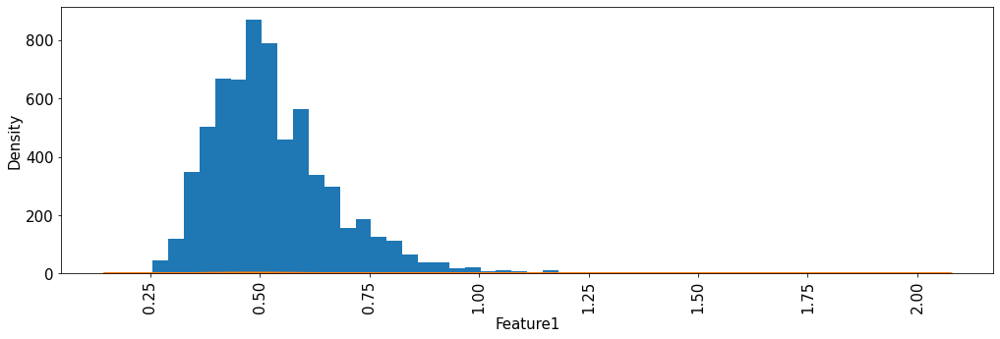

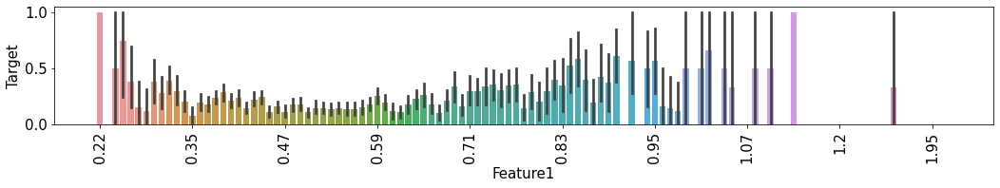


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature1,numerical,1.756908,8.600108,not_normal


QQ plot on original vs. LOG normalised values


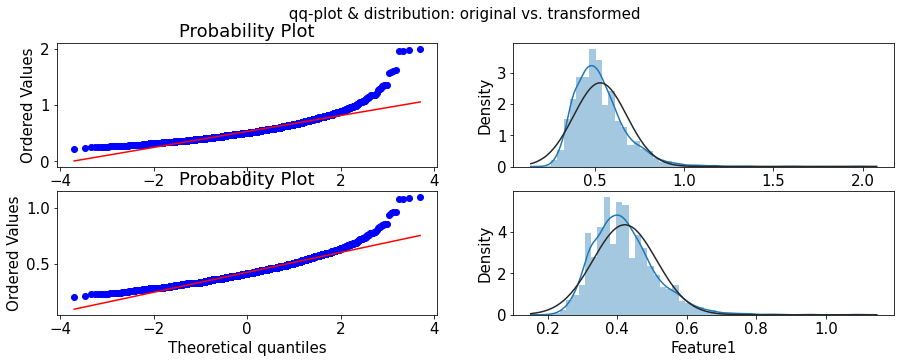

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature1,numerical,1.099543,3.191761,not_normal


QQ plot on original vs. BOX normalised values


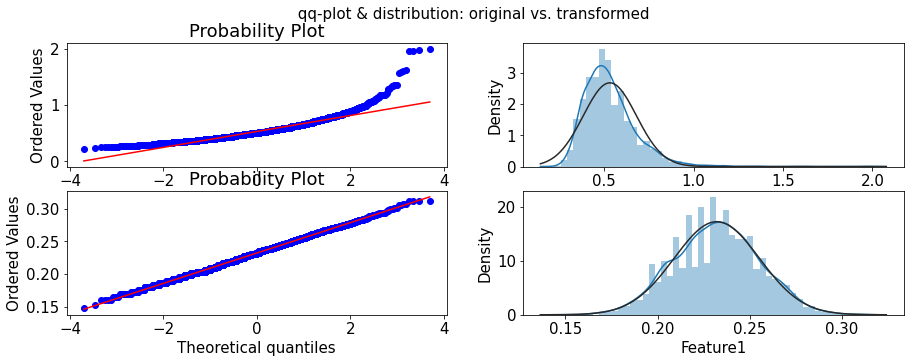

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature1,numerical,0.007610,-0.114999,normal


Are  Feature1  and  Target  correlated?
Spearmans correlation coefficient: 0.017344
Samples are NOT correlated (fail to reject H0) p=0.162
-------------------------
Kendall correlation coefficient: 0.014324
Samples are NOT correlated (fail to reject H0) p=0.162


In [23]:
analyse_single_feature("Feature1", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{8.4, 8.7, 10.13333333, 9.5, 10.8, 11.3, 10.6, 12.7, 9.7, 10.0, 9.55, 11.9, 11.7, 13.0, 13.4, 14.0, 8.5, 8.0, 9.0, 9.566666667, 9.25, 9.75, 10.5, 10.75, 11.75, 11.0, 11.5, 11.73333333, 11.63333333, 12.5, 12.0, 12.75, 12.25, 11.36666667, 13.5, 13.13333333, 11.05, 11.55, 12.05, 8.9, 9.4, 9.9, 9.733333333, 9.233333333, 10.15, 10.9, 10.4, 10.03333333, 10.65, 11.4, 11.94, 11.65, 10.53333333, 12.4, 12.9, 12.15, 13.9, 14.9, 9.633333333, 11.06666667, 8.8, 9.8, 9.2, 9.3, 9.05, 9.95, 10.2, 10.93333333, 10.7, 10.3, 10.55, 11.8, 11.2, 11.95, 10.56666667, 11.45, 12.2, 12.8, 12.3, 12.06666667, 12.89333333, 13.05, 13.3, 13.55, 13.2, 13.7, 14.2, 13.56666667, 14.05, 11.43333333, 13.8, 11.26666667, 8.6, 9.533333333, 9.1, 9.6, 10.1, 10.96666667, 10.46666667, 11.6, 11.1, 11.85, 11.35, 11.46666667, 12.33333333, 12.1, 12.6, 11.33333333, 13.1, 13.6, 10.98}

Basics details


,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature2,0,0.0,111,1.708481,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature2,6497.0,10.491801,1.192712,8.0,9.5,10.3,11.3,14.9



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature2  NOT present in TRAIN set!


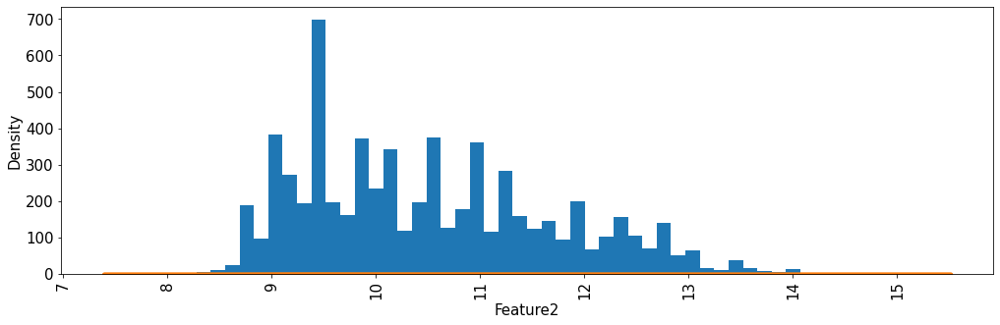

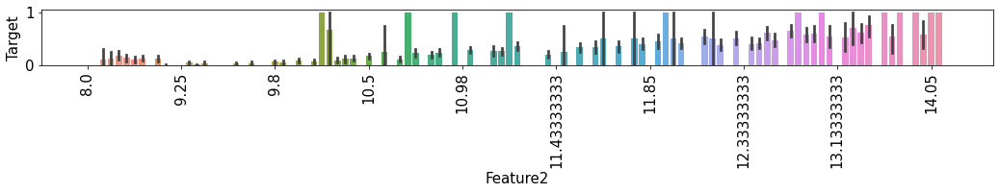


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature2,numerical,0.565718,-0.531687,not_normal


QQ plot on original vs. LOG normalised values


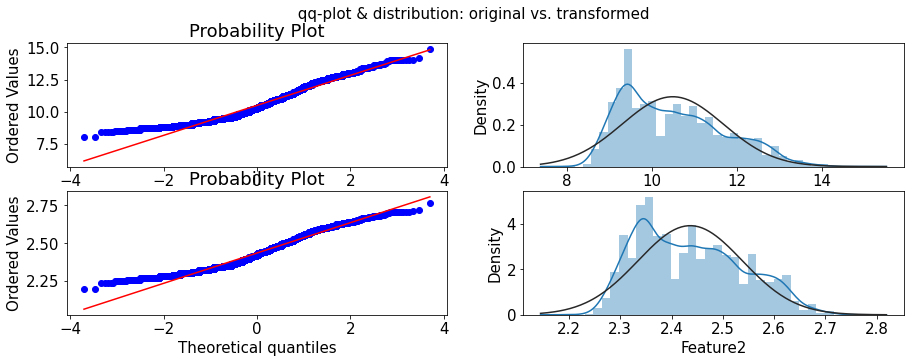

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature2,numerical,0.397221,-0.761794,normal


QQ plot on original vs. BOX normalised values


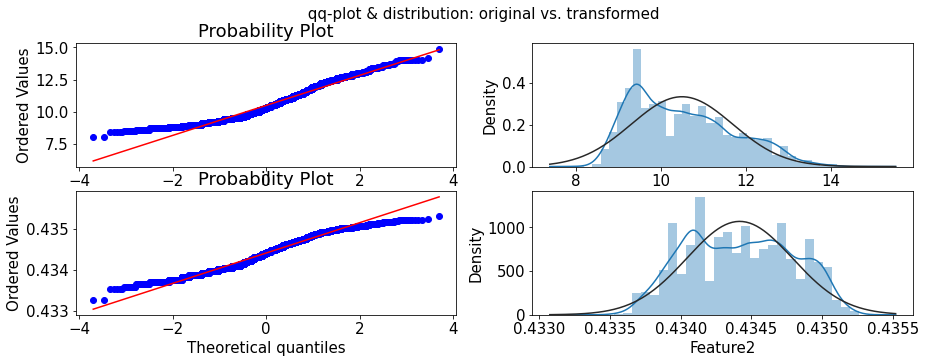

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature2,numerical,0.034889,-0.979930,normal


Are  Feature2  and  Target  correlated?
Spearmans correlation coefficient: 0.363982
Samples are correlated (reject H0) p=0.000000
-------------------------
Kendall correlation coefficient: 0.301073
Samples are correlated (reject H0) p=0.000000


In [24]:
analyse_single_feature("Feature2", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{'B', 'A'}

Basics details


,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature3,0,0.0,2,0.030783,6497,object


,Entries,Frequency,Frequency[%]
1,A,4898,75.388641
0,B,1599,24.611359



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature3  NOT present in TRAIN set!
Feature Feature3  is categorical in TRAIN set!


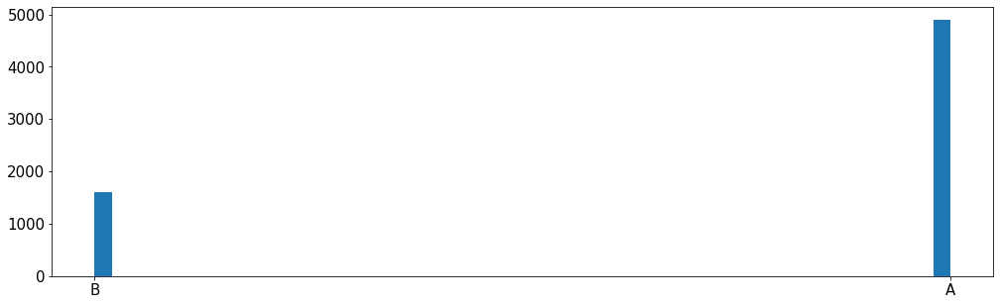

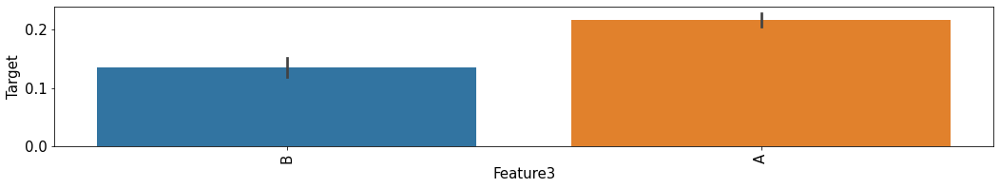

Feature3  is NOT numerical!


In [25]:
analyse_single_feature("Feature3", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{0.992, 1.00014, 1.0, 0.9924, 0.9897, 0.99064, 0.99655, 1.0004, 0.99362, 0.98963, 0.99728, 0.99334, 0.99137, 0.99531, 0.9894, 0.99644, 0.99841, 0.998365, 1.00038, 0.99175, 0.99372, 0.99954, 0.98978, 0.99682, 0.99485, 0.99091, 0.99795, 0.99598, 0.98819, 0.99908, 0.99636, 0.99439, 0.99833, 0.99552, 0.99946, 0.99167, 0.9928, 0.99862, 0.99477, 0.98886, 0.9959, 0.99787, 0.99196, 0.99393, 0.99121, 0.99506, 0.99925, 0.99628, 0.99037, 0.99234, 0.9884, 1.0021, 1.00013, 1.00022, 0.99347, 0.98962, 0.99544, 0.99741, 0.99657, 0.99075, 0.99272, 0.99854, 0.98878, 1.00051, 0.99385, 0.99188, 0.99498, 0.99695, 0.99892, 0.98916, 1.0008, 0.99226, 0.99808, 0.99733, 0.99142, 0.99536, 0.99339, 1.00315, 1.00118, 0.99649, 0.99452, 0.9887, 0.9918, 0.99293, 0.99096, 0.99687, 0.9949, 0.98711, 0.998, 0.99021, 0.99603, 0.99331, 0.99528, 0.99134, 0.98862, 0.99444, 0.99838, 0.99641, 0.99172, 0.99557, 0.99754, 0.98975, 0.99482, 0.99088, 0.99792, 0.99398, 0.99201, 0.99595, 0.98816, 0.99708, 0.99126, 0.99

,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature4,0,0.0,998,15.360936,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature4,6497.0,0.994697,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature4  NOT present in TRAIN set!


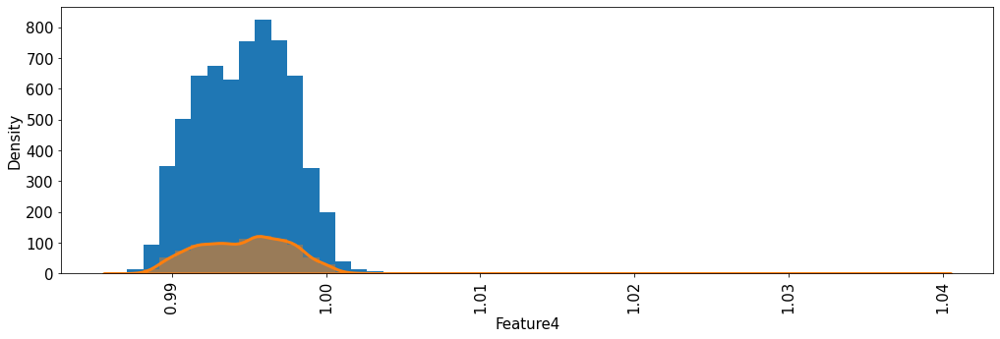

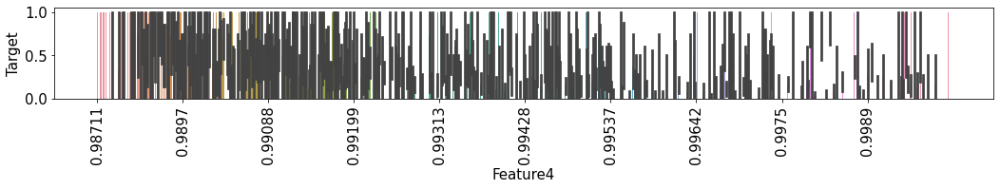


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature4,numerical,0.503602,6.606067,not_normal


QQ plot on original vs. LOG normalised values


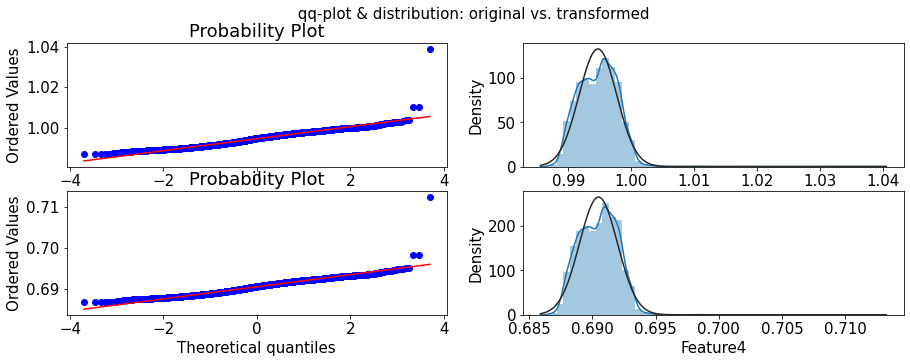

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature4,numerical,0.485163,6.302020,not_normal


QQ plot on original vs. BOX normalised values


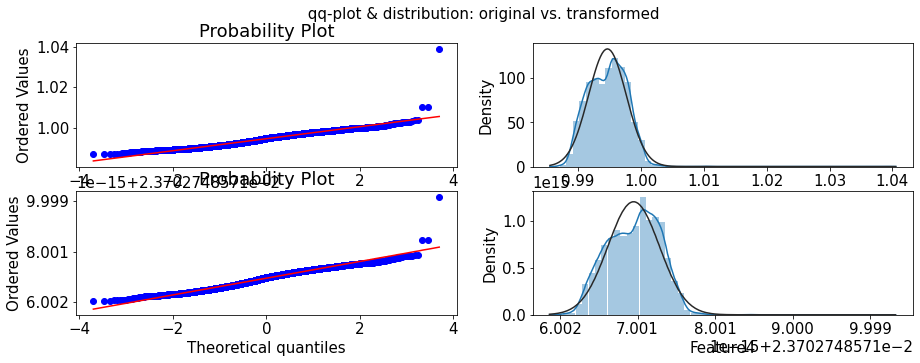

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature4,numerical,0,0,normal


Are  Feature4  and  Target  correlated?
Spearmans correlation coefficient: -0.276785
Samples are correlated (reject H0) p=0.000000
-------------------------
Kendall correlation coefficient: -0.226393
Samples are correlated (reject H0) p=0.000000


In [26]:
analyse_single_feature("Feature4", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0}

Basics details


,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature5,5692,87.609666,12,0.184701,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature5,805.0,5.631056,3.403142,0.0,3.0,6.0,9.0,11.0



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature5  NOT present in TRAIN set!


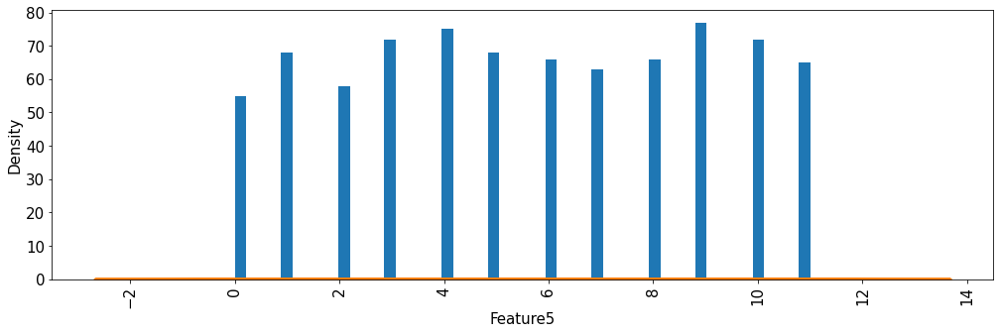

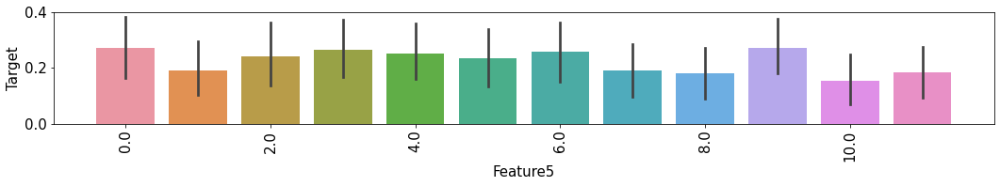


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature5,numerical,3.312000,10.039308,not_normal


QQ plot on original vs. LOG normalised values


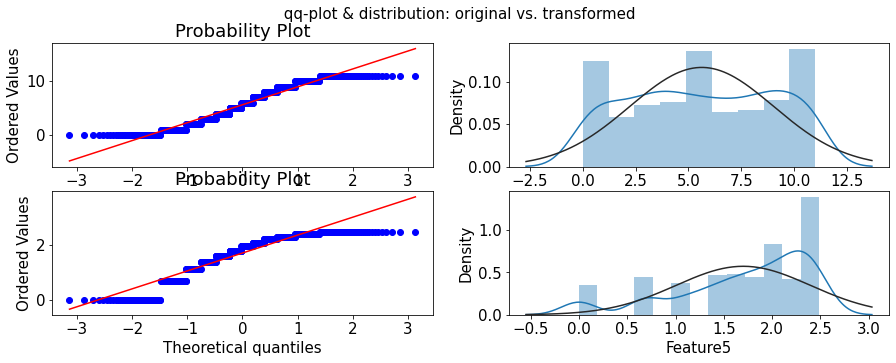

was log-transform enough?


,numerical_feature,type,shapiro_pvalue,skew,kurtosis,normal?
0,Feature5,numerical,0.000000,-0.998422,0.168902,not_normal


QQ plot on original vs. BOX normalised values


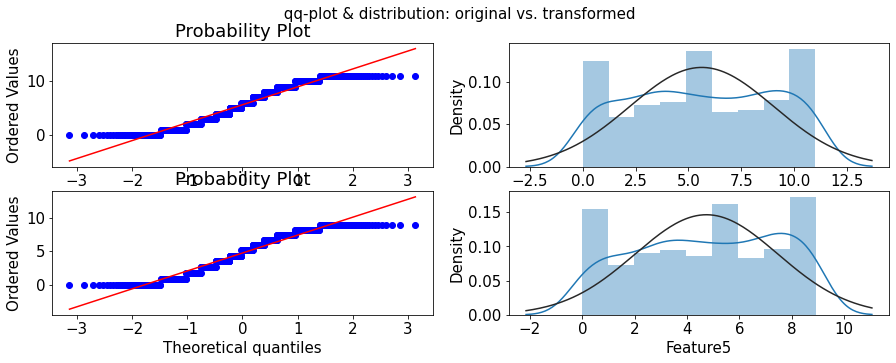

was BoxCox-transform enough?


,numerical_feature,type,shapiro_pvalue,skew,kurtosis,normal?
0,Feature5,numerical,0.000000,-0.124254,-1.163717,normal


Are  Feature5  and  Target  correlated?
Spearmans correlation coefficient: -0.045953
Samples are NOT correlated (fail to reject H0) p=0.193
-------------------------
Kendall correlation coefficient: -0.039064
Samples are NOT correlated (fail to reject H0) p=0.193


In [27]:
analyse_single_feature("Feature5", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 159.0, 160.

,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature6,0,0.0,276,4.248115,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature6,6497.0,115.744574,56.521855,6.0,77.0,118.0,156.0,440.0



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature6  NOT present in TRAIN set!


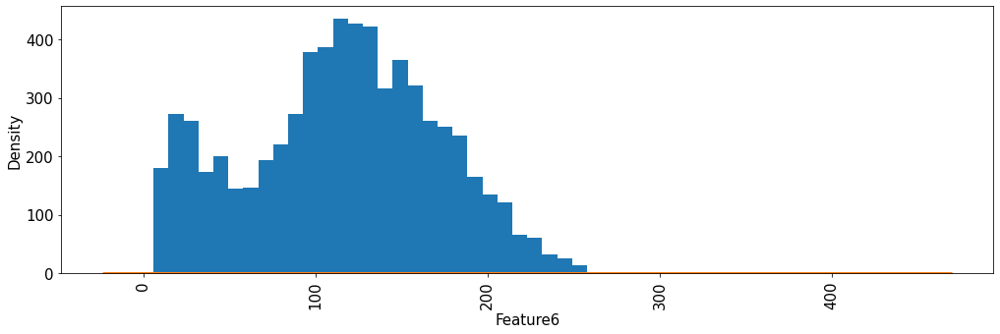

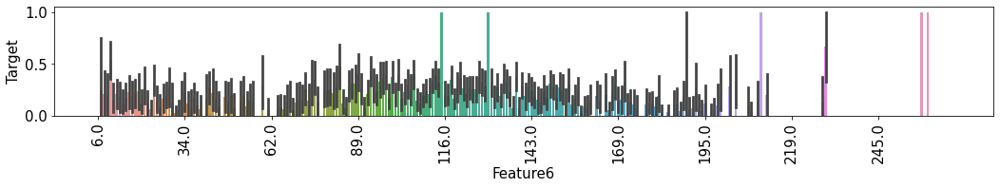


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature6,numerical,-0.001177,-0.371664,normal


QQ plot on original vs. LOG normalised values


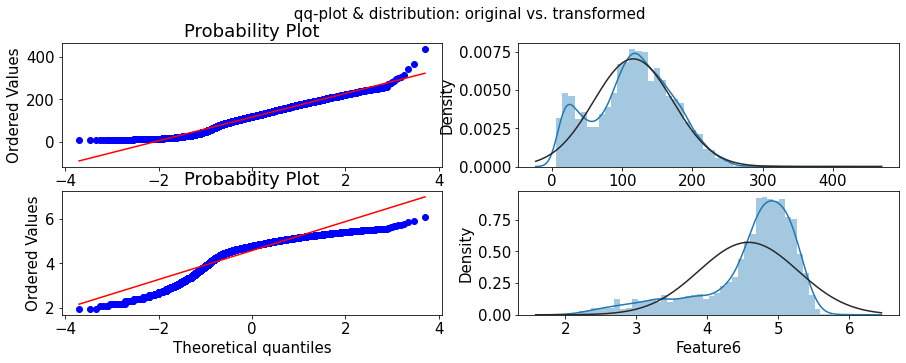

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature6,numerical,-1.350357,1.274064,not_normal


QQ plot on original vs. BOX normalised values


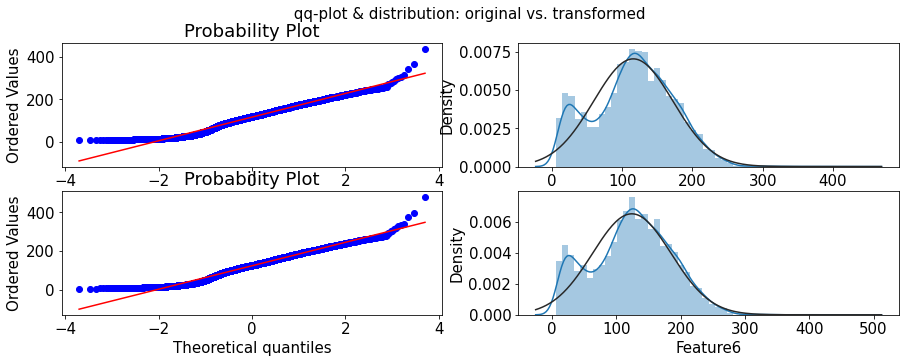

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature6,numerical,0.020463,-0.353403,normal


Are  Feature6  and  Target  correlated?
Spearmans correlation coefficient: -0.056287
Samples are correlated (reject H0) p=0.000006
-------------------------
Kendall correlation coefficient: -0.046080
Samples are correlated (reject H0) p=0.000006


In [28]:
analyse_single_feature("Feature6", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{3.8, 4.8, 5.2, 6.9, 7.5, 7.1, 7.0, 7.2, 10.0, 7.7, 6.6, 7.3, 6.4, 8.1, 8.0, 9.3, 10.2, 11.0, 13.2, 13.0, 15.0, 4.5, 5.5, 5.0, 6.0, 6.5, 8.5, 9.0, 9.5, 10.5, 11.5, 12.5, 12.0, 13.5, 14.0, 15.5, 3.9, 4.4, 4.9, 5.9, 5.4, 6.15, 7.4, 7.9, 7.15, 8.9, 8.4, 9.4, 9.9, 10.4, 10.9, 11.4, 11.9, 12.9, 12.4, 13.4, 15.9, 5.8, 5.3, 6.8, 6.3, 7.8, 8.2, 8.8, 8.3, 8.7, 9.7, 9.2, 9.8, 10.8, 10.3, 10.7, 11.3, 11.8, 11.2, 11.7, 12.7, 12.2, 12.3, 12.8, 13.8, 13.3, 13.7, 14.2, 14.3, 4.7, 4.2, 5.7, 6.7, 6.2, 6.45, 4.6, 5.6, 5.1, 6.1, 7.6, 8.6, 9.6, 9.1, 10.6, 10.1, 11.6, 11.1, 12.6, 12.1, 15.6}

Basics details


,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature7,10,0.153917,106,1.631522,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature7,6487.0,7.216579,1.29675,3.8,6.4,7.0,7.7,15.9



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature7  NOT present in TRAIN set!


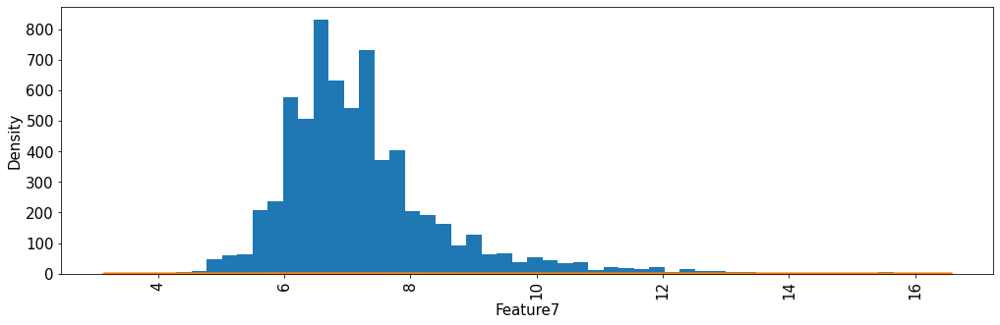

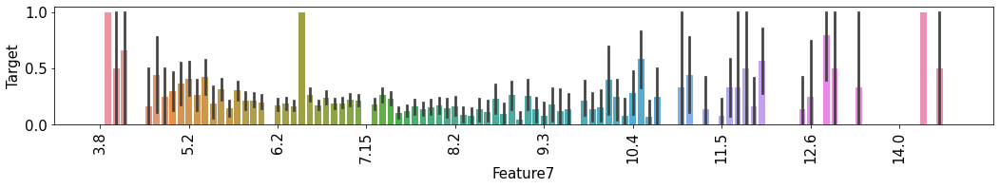


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature7,numerical,1.384853,5.748877,not_normal


QQ plot on original vs. LOG normalised values


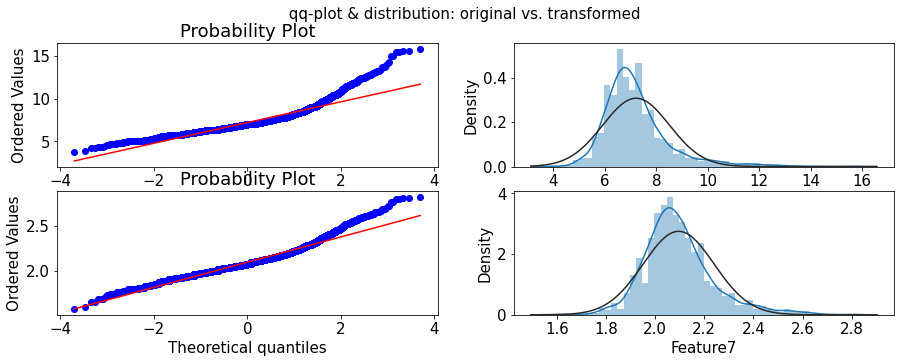

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature7,numerical,0.976259,2.100925,not_normal


QQ plot on original vs. BOX normalised values


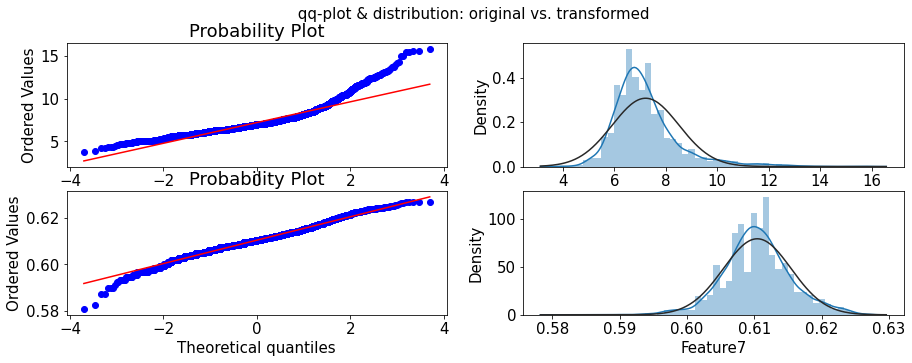

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature7,numerical,-0.025587,1.050646,normal


Are  Feature7  and  Target  correlated?
Spearmans correlation coefficient: -0.066338
Samples are correlated (reject H0) p=0.000000
-------------------------
Kendall correlation coefficient: -0.054956
Samples are correlated (reject H0) p=0.000000


In [29]:
analyse_single_feature("Feature7", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{1.5, 2.3, 2.5, 4.9, 4.5, 6.85, 7.7, 8.1, 6.8, 10.55, 6.9, 9.8, 13.2, 14.5, 15.5, 14.9, 16.2, 14.0, 3.0, 16.7, 3.5, 17.5, 4.0, 4.25, 16.95, 26.05, 5.0, 5.5, 20.15, 4.75, 6.0, 6.5, 1.25, 1.0, 31.6, 7.25, 7.5, 7.0, 1.75, 7.75, 8.5, 8.0, 8.25, 8.75, 9.5, 9.0, 9.25, 10.0, 10.5, 2.0, 11.25, 2.25, 11.0, 11.75, 12.0, 12.5, 11.5, 12.75, 65.8, 13.0, 13.5, 14.75, 15.0, 15.25, 15.75, 16.0, 3.75, 16.5, 16.75, 17.0, 17.75, 18.75, 18.0, 18.5, 19.5, 19.25, 22.0, 23.5, 5.25, 6.75, 4.6, 4.1, 4.35, 4.85, 5.35, 5.1, 5.6, 5.85, 6.1, 6.6, 6.35, 7.35, 7.85, 7.1, 7.6, 8.6, 9.1, 9.6, 9.85, 10.1, 10.6, 11.1, 11.6, 12.1, 12.6, 12.85, 13.1, 13.6, 14.1, 14.6, 14.35, 15.6, 15.1, 0.8, 1.8, 1.3, 1.55, 1.05, 16.6, 16.85, 16.1, 17.1, 17.85, 17.6, 17.35, 18.1, 18.35, 18.6, 19.1, 19.35, 19.6, 2.65, 22.6, 3.65, 0.6, 8.7, 8.2, 8.95, 8.45, 9.2, 9.7, 10.7, 10.2, 11.2, 11.7, 11.95, 11.45, 12.7, 12.2, 13.7, 14.45, 14.7, 14.2, 14.95, 2.7, 15.7, 15.2, 2.2, 2.95, 3.45, 16.45, 3.2, 3.7, 3.95, 4.2, 17.95, 17.45, 17.

,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature8,2,0.030783,316,4.863783,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature8,6495.0,5.444326,4.758125,0.6,1.8,3.0,8.1,65.8



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature8  NOT present in TRAIN set!


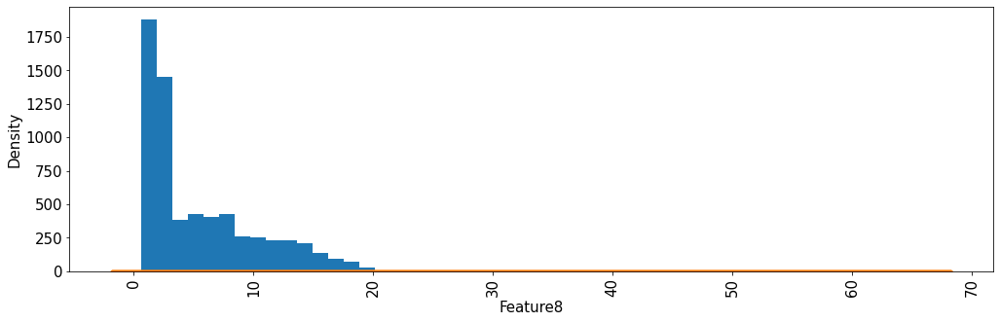

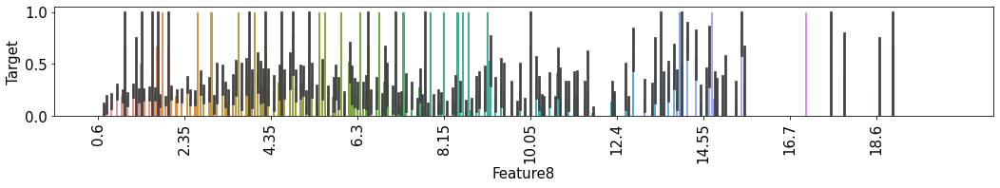


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature8,numerical,1.434949,4.357018,not_normal


QQ plot on original vs. LOG normalised values


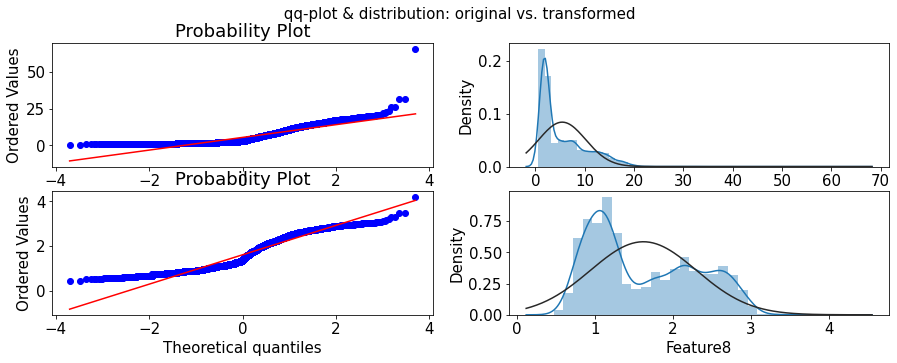

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature8,numerical,0.414434,-1.160987,normal


QQ plot on original vs. BOX normalised values


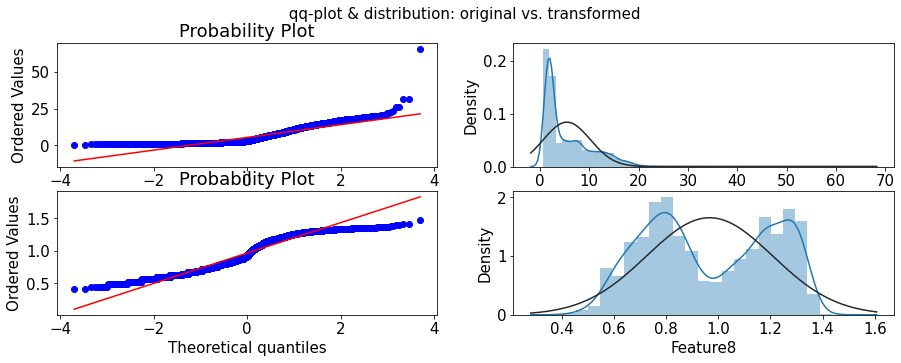

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature8,numerical,0.014187,-1.354660,normal


Are  Feature8  and  Target  correlated?
Spearmans correlation coefficient: -0.033685
Samples are correlated (reject H0) p=0.006629
-------------------------
Kendall correlation coefficient: -0.027702
Samples are correlated (reject H0) p=0.006638


In [30]:
analyse_single_feature("Feature8", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{0.8, 1.3, 2.1, 2.5, 2.9, 3.2, 2.85, 1.1, 2.2, 9.8, 10.1, 6.5, 8.7, 5.7, 14.5, 10.7, 3.0, 17.2, 14.9, 14.1, 14.6, 3.75, 18.15, 15.55, 4.5, 4.0, 5.0, 18.95, 4.75, 20.8, 4.25, 1.5, 1.0, 6.0, 5.5, 7.5, 7.0, 8.5, 8.0, 9.0, 10.5, 10.0, 2.0, 11.0, 12.0, 12.5, 13.5, 13.0, 15.5, 15.0, 16.0, 3.5, 16.5, 17.9, 17.75, 17.85, 18.1, 18.4, 1.9, 1.4, 2.4, 2.65, 3.4, 3.9, 4.9, 4.4, 4.65, 5.4, 5.9, 6.4, 6.9, 7.9, 7.4, 8.9, 8.4, 9.65, 9.9, 9.4, 10.4, 11.4, 11.9, 12.4, 12.9, 13.9, 13.65, 14.4, 2.3, 2.8, 15.15, 15.4, 3.3, 3.8, 4.3, 1.8, 4.8, 5.3, 5.8, 6.3, 6.8, 7.8, 0.9, 0.6, 8.55, 8.8, 8.3, 8.2, 9.05, 9.3, 9.2, 0.7, 0.95, 10.2, 10.8, 10.3, 1.2, 1.7, 11.8, 11.2, 11.3, 1.95, 12.55, 12.3, 12.8, 12.2, 13.3, 13.7, 13.55, 13.8, 14.7, 14.2, 14.3, 2.7, 15.3, 15.7, 3.7, 16.05, 16.7, 16.2, 4.2, 4.45, 17.3, 4.7, 17.95, 5.2, 18.3, 18.05, 18.2, 6.2, 6.7, 7.7, 7.2, 7.95, 9.7, 4.6, 4.1, 5.1, 6.6, 6.1, 7.1, 7.6, 1.6, 1.35, 8.6, 8.1, 2.6, 9.6, 9.1, 3.1, 3.6, 10.6, 11.1, 11.6, 12.1, 12.85, 13.6, 13.1, 14.35,

,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature8,0,0.0,179,22.319202,802,float64


,count,mean,std,min,25%,50%,75%,max
Feature8,802.0,5.441895,4.555406,0.6,1.8,3.2,8.0,20.8



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature8  NOT present in TRAIN set!


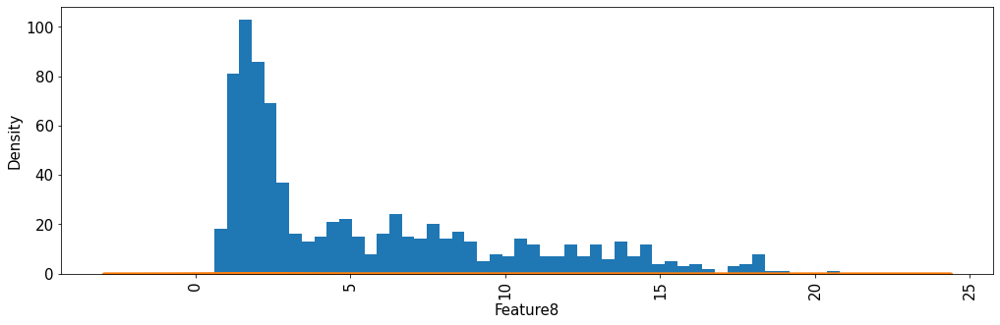

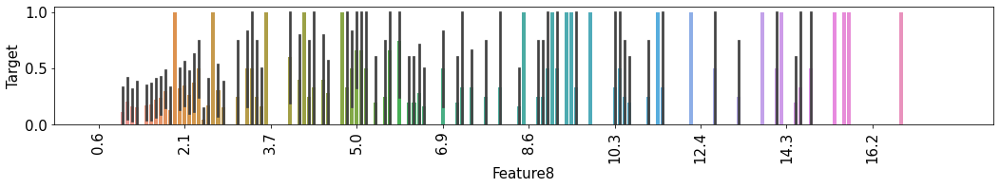


Normality set


,numerical_feature,type,shapiro_pvalue,skew,kurtosis,normal?
0,Feature8,numerical,0.000000,1.085304,0.153090,not_normal


QQ plot on original vs. LOG normalised values


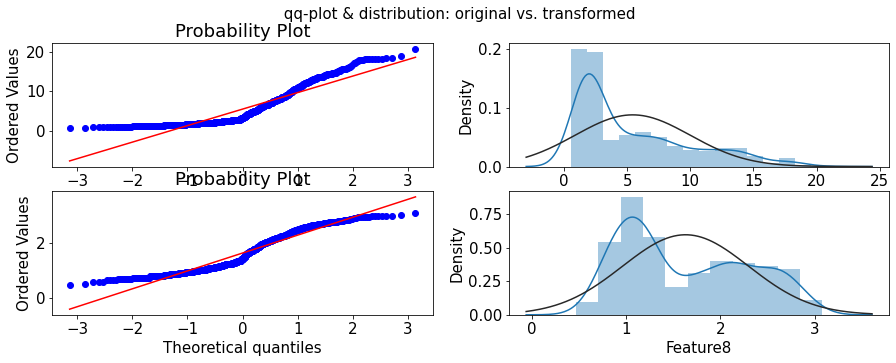

was log-transform enough?


,numerical_feature,type,shapiro_pvalue,skew,kurtosis,normal?
0,Feature8,numerical,0.000000,0.364180,-1.205294,normal


QQ plot on original vs. BOX normalised values


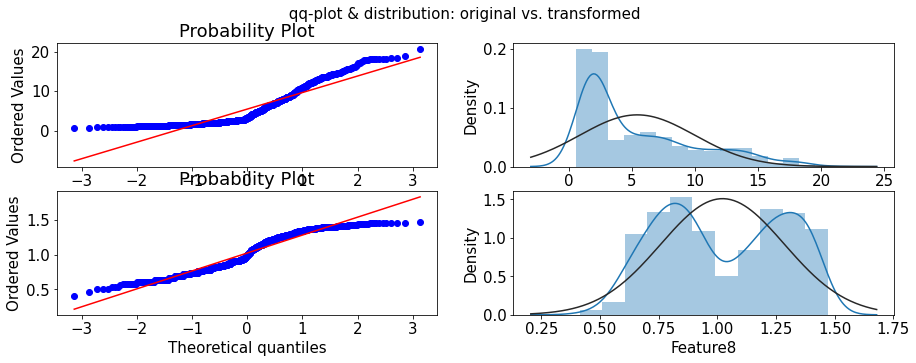

was BoxCox-transform enough?


,numerical_feature,type,shapiro_pvalue,skew,kurtosis,normal?
0,Feature8,numerical,0.000000,0.003663,-1.330016,normal


Are  Feature8  and  Target  correlated?
Spearmans correlation coefficient: -0.024689
Samples are NOT correlated (fail to reject H0) p=0.485
-------------------------
Kendall correlation coefficient: -0.020307
Samples are NOT correlated (fail to reject H0) p=0.485


In [31]:
# Feature8 has an entry with "-" hence is flagged as object = categorical
dummy  = pdf.replace("-", np.NaN)
dummy = dummy.dropna(how = 'any', axis = 0) 
dummy["Feature8"] = dummy["Feature8"].astype("float")

analyse_single_feature("Feature8", 
                       dummy, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{'0.23', '1.24', '0.875', '0.385', '0.415', '0.47', '1.005', '0.455', '1', '0.645', '0.915', '0.98', '0.26', '0.295', '0.42', '0.43', '0.835', '1.07', '0.48', '0.87', '0.8', '0.9', '0.895', '0.425', '0.77', '0.7', '0.585', '0.11', '1.09', '0.14', '0.935', '0.68', '0.435', '1.01', '0.375', '0.275', '0.96', '0.145', '0.225', '0.41', '0.205', '0.215', '0.51', '0.12', '-', '0.135', '0.66', '0.46', '0.64', '0.91', '0.365', '0.905', '0.19', '0.355', '0.485', '0.345', '0.325', '1.185', '0.72', '0.15', '0.84', '0.545', '0.34', '0.55', '0.39', '0.635', '0.24', '0.705', '0.865', '0.85', '0.86', '0.59', '0.475', '0.745', '0.44', '0.38', '0.6', '0.33', '0.93', '0.105', '0.22', '0.35', '0.405', '0.575', '0.315', '0.305', '0.09', '1.58', '0.565', '0.75', '0.27', '0.81', '0.95', '0.49', '0.63', '0.21', '0.73', '0.825', '1.115', '0.155', '0.815', '0.255', '0.845', '0.235', '0.685', '0.5', '1.1', '0.32', '0.76', '0.54', '0.62', '0.085', '0.1', '1.025', '0.735', '0.67', '1.13', '0.495', '

,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature9,0,0.0,188,2.893643,6497,object


,Entries,Frequency,Frequency[%]
125,0.28,286,4.402032
66,0.24,265,4.078806
12,0.26,255,3.924888
139,0.25,238,3.663229
80,0.22,235,3.617054
...,...,...,...
122,0.175,1,0.015392
127,1.035,1,0.015392
128,0.975,1,0.015392
130,0.805,1,0.015392



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature9  NOT present in TRAIN set!
Feature Feature9  is categorical in TRAIN set!


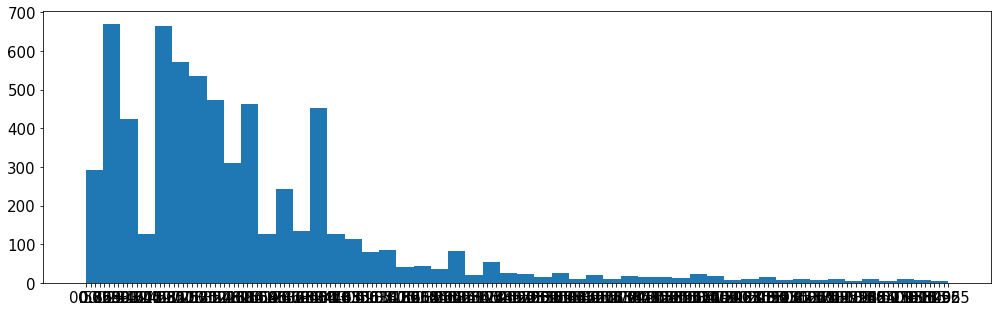

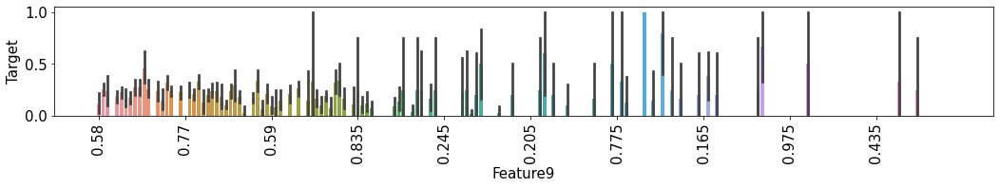

Feature9  is NOT numerical!


In [32]:
analyse_single_feature("Feature9", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{2.91, 2.96, 3.07, 3.19, 3.13, 3.17, 3.53, 3.2, 3.33, 3.15, 3.03, 4.01, 3.25, 3.0, 3.5, 3.75, 2.93, 2.86, 3.11, 3.18, 3.36, 3.43, 3.61, 3.68, 2.79, 3.04, 3.54, 3.29, 3.79, 2.9, 2.97, 2.72, 3.22, 3.4, 3.47, 3.65, 3.72, 3.9, 2.83, 3.01, 3.26, 3.08, 3.76, 3.58, 3.51, 2.94, 3.44, 3.69, 2.87, 2.8, 3.37, 3.12, 3.62, 3.3, 3.05, 3.55, 3.8, 2.98, 3.48, 3.23, 2.84, 3.34, 3.16, 3.09, 3.41, 3.59, 3.66, 2.77, 3.52, 3.27, 3.02, 3.77, 2.95, 2.88, 3.38, 3.63, 3.45, 3.7, 3.56, 3.06, 3.31, 3.81, 2.99, 2.92, 2.74, 3.49, 3.24, 3.42, 3.74, 3.67, 2.85, 3.1, 3.28, 3.78, 3.6, 3.35, 3.85, 3.46, 3.71, 3.21, 2.89, 2.82, 3.57, 3.32, 3.14, 3.39, 3.64, 3.82}

Basics details


,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature10,9,0.138525,108,1.662306,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature10,6488.0,3.218395,0.160748,2.72,3.11,3.21,3.32,4.01



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature10  NOT present in TRAIN set!


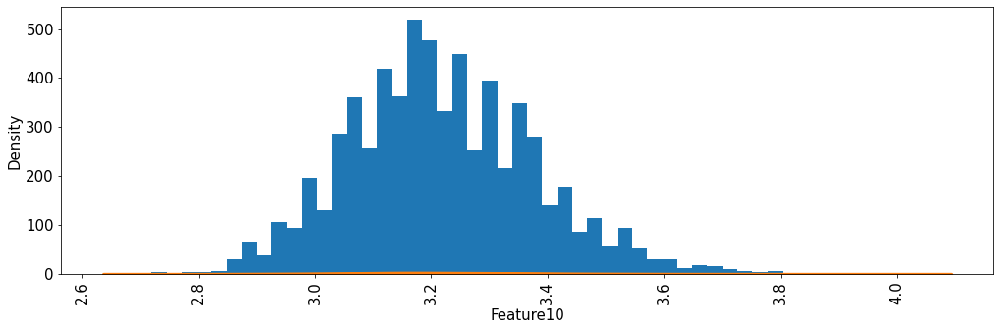

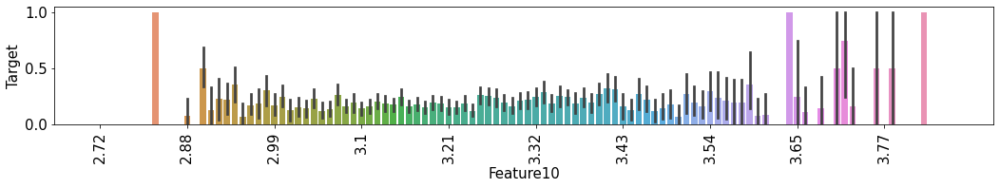


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature10,numerical,-5.479526,90.267908,not_normal


QQ plot on original vs. LOG normalised values


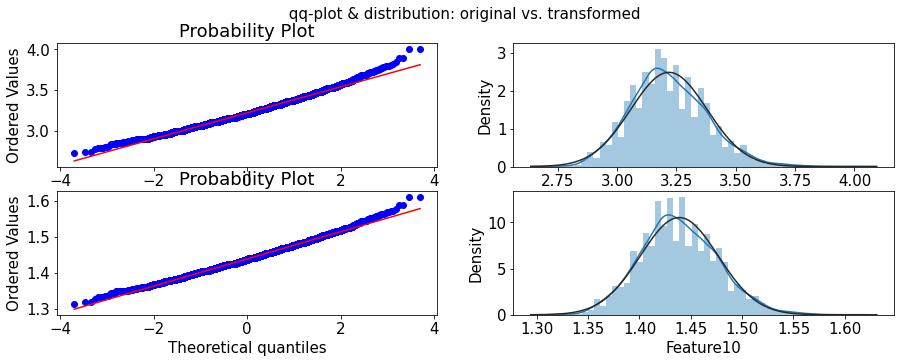

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature10,numerical,0.264006,0.199021,normal


QQ plot on original vs. BOX normalised values


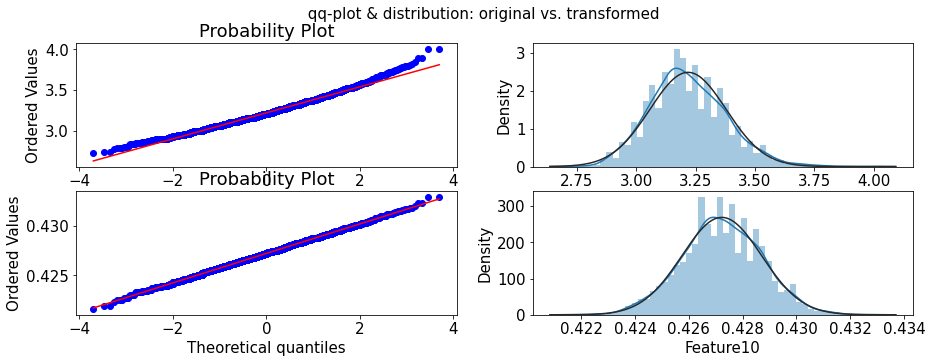

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature10,numerical,-0.000537,0.024330,normal


Are  Feature10  and  Target  correlated?
Spearmans correlation coefficient: 0.033659
Samples are correlated (reject H0) p=0.006700
-------------------------
Kendall correlation coefficient: 0.027732
Samples are correlated (reject H0) p=0.006709


In [33]:
analyse_single_feature("Feature10", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{0.49, 0.0, 0.27, 0.25, 0.5, 0.26, 0.51, 0.76, 0.54, 0.79, 0.75, 1.0, 0.22, 0.23, 0.21, 0.13, 0.38, 0.63, 0.88, 0.47, 0.72, 0.19, 0.42, 0.43, 0.18, 0.44, 0.2, 0.45, 0.46, 0.41, 0.67, 0.69, 0.16, 0.15, 0.17, 0.55, 0.8, 0.39, 0.14, 0.64, 0.48, 0.73, 1.23, 0.57, 0.82, 1.66, 0.37, 0.4, 0.36, 0.59, 0.35, 0.6, 0.66, 0.61, 0.86, 0.12, 0.68, 0.11, 0.52, 0.7, 0.09, 0.1, 0.08, 0.56, 0.81, 0.65, 0.24, 0.74, 0.99, 0.58, 0.3, 0.33, 0.32, 0.34, 0.29, 0.31, 0.06, 0.07, 0.05, 0.04, 0.28, 0.53, 0.78, 0.62, 0.03, 0.71, 0.02, 0.01, 0.91}

Basics details


,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature11,3,0.046175,89,1.369863,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature11,6494.0,0.318722,0.145265,0.0,0.25,0.31,0.39,1.66



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature11  NOT present in TRAIN set!


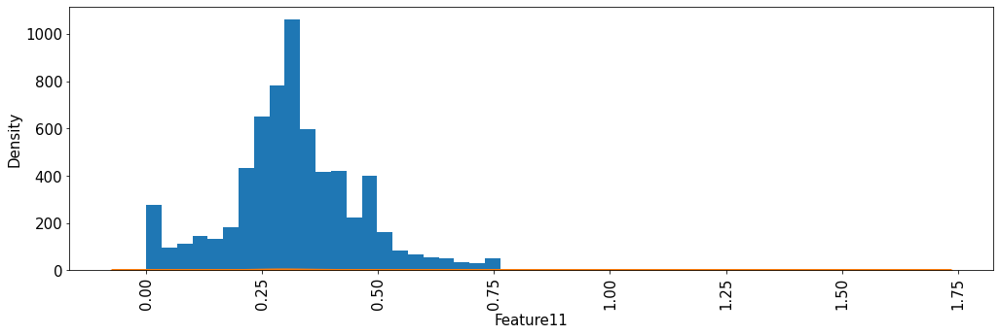

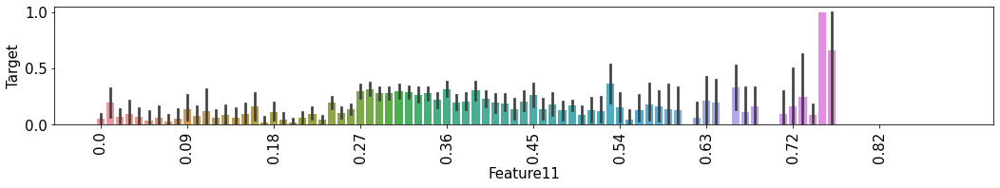


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature11,numerical,0.469739,2.392693,not_normal


QQ plot on original vs. LOG normalised values


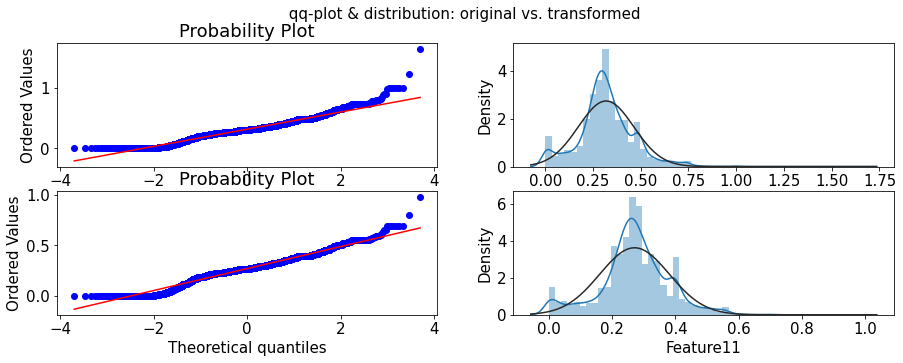

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature11,numerical,-0.087447,1.079279,normal


QQ plot on original vs. BOX normalised values


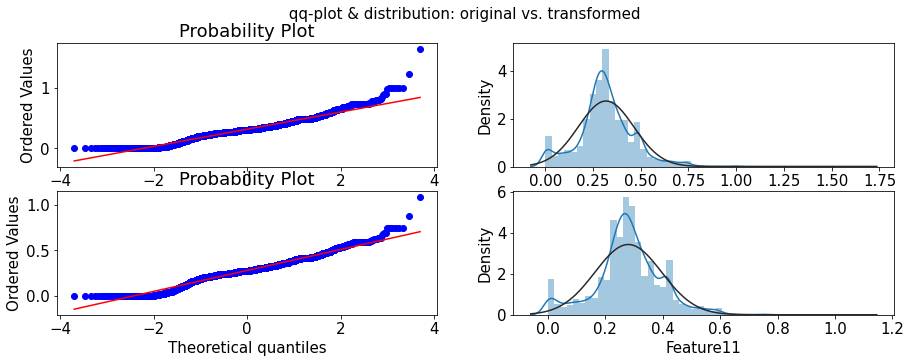

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature11,numerical,0.020154,1.211460,normal


Are  Feature11  and  Target  correlated?
Spearmans correlation coefficient: 0.075734
Samples are correlated (reject H0) p=0.000000
-------------------------
Kendall correlation coefficient: 0.062633
Samples are correlated (reject H0) p=0.000000


In [34]:
analyse_single_feature("Feature11", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot"])


Unique values
{0.137, 0.119, 0.611, 0.123, 0.401, 0.121, 0.387, 0.125, 0.403, 0.369, 0.25, 0.244, 0.414, 0.156, 0.107, 0.113, 0.109, 0.103, 0.115, 0.117, 0.105, 0.111, 0.15, 0.267, 0.341, 0.144, 0.089, 0.23, 0.087, 0.093, 0.091, 0.095, 0.099, 0.097, 0.214, 0.212, 0.13, 0.255, 0.167, 0.124, 0.161, 0.073, 0.083, 0.079, 0.085, 0.077, 0.081, 0.071, 0.075, 0.368, 0.149, 0.067, 0.061, 0.343, 0.065, 0.063, 0.18, 0.174, 0.184, 0.301, 0.069, 0.186, 0.143, 0.055, 0.053, 0.051, 0.057, 0.135, 0.217, 0.045, 0.043, 0.047, 0.049, 0.211, 0.037, 0.041, 0.039, 0.16, 0.197, 0.166, 0.031, 0.035, 0.17, 0.033, 0.152, 0.168, 0.148, 0.029, 0.027, 0.154, 0.271, 0.023, 0.025, 0.236, 0.021, 0.019, 0.185, 0.017, 0.015, 0.222, 0.013, 0.464, 0.142, 0.009, 0.179, 0.171, 0.216, 0.173, 0.165, 0.12, 0.235, 0.136, 0.346, 0.118, 0.243, 0.122, 0.132, 0.126, 0.128, 0.159, 0.204, 0.241, 0.104, 0.108, 0.11, 0.106, 0.102, 0.114, 0.112, 0.19, 0.116, 0.61, 0.36, 0.059, 0.092, 0.09, 0.094, 0.098, 0.1, 0.088, 0.086, 0.096, 0.205

,Feature,No missing value,Missing[%],No unique value,Cardinality[%],No Values,dtype
0,Feature12,2,0.030783,214,3.293828,6497,float64


,count,mean,std,min,25%,50%,75%,max
Feature12,6495.0,0.056042,0.035036,0.009,0.038,0.047,0.065,0.611



Compare histogram and kde
No of bins used for histograme:  50
Feature Feature12  NOT present in TRAIN set!


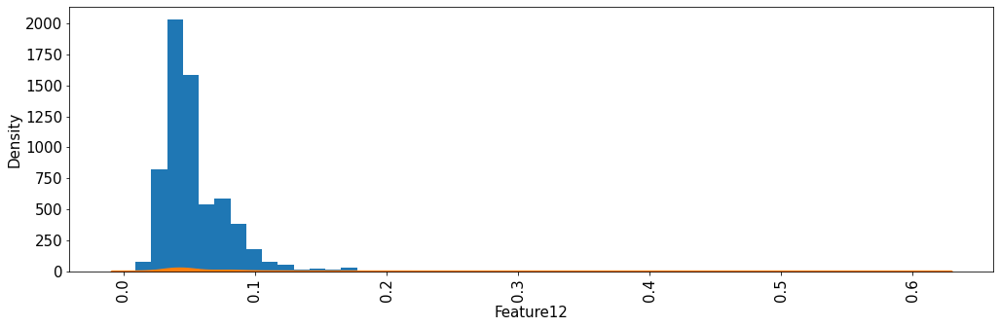

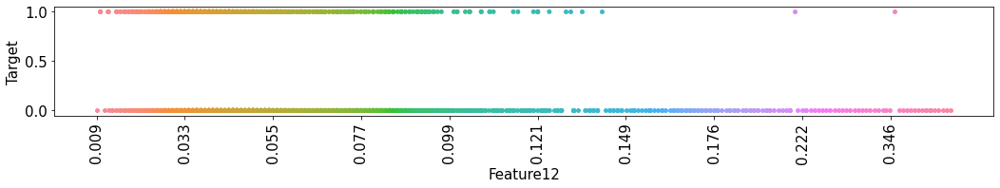

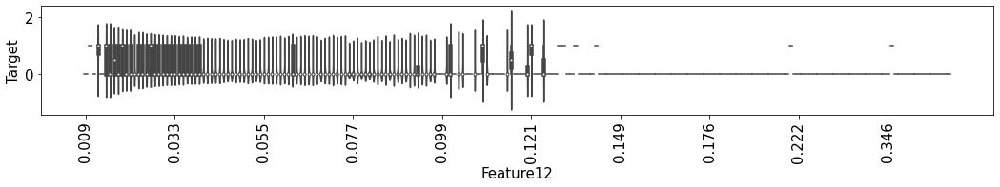

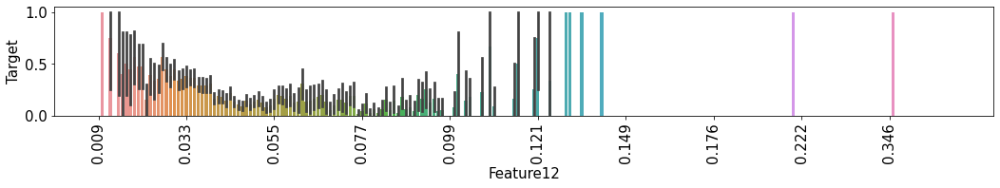


Normality set


,numerical_feature,type,skew,kurtosis,normal?
0,Feature12,numerical,5.394522,50.839263,not_normal


QQ plot on original vs. LOG normalised values


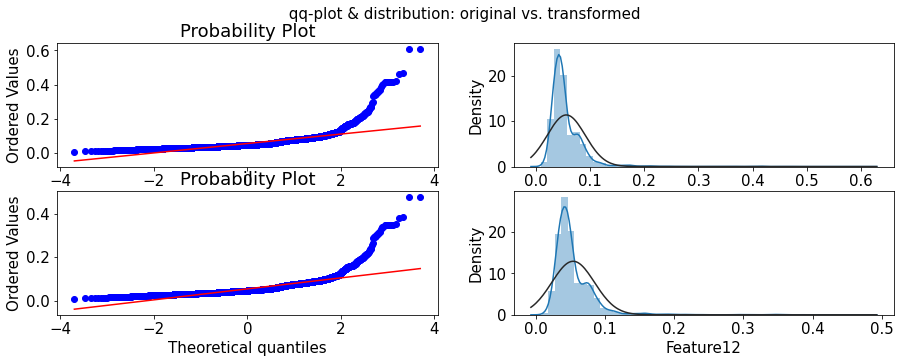

was log-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature12,numerical,4.484507,35.602223,not_normal


QQ plot on original vs. BOX normalised values


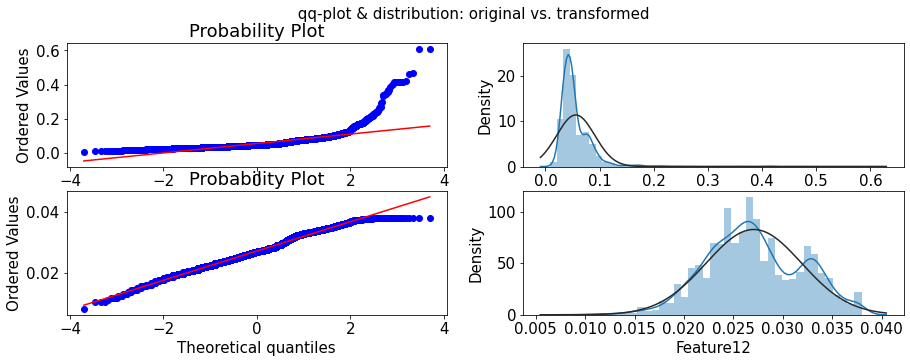

was BoxCox-transform enough?


,numerical_feature,type,skew,kurtosis,normal?
0,Feature12,numerical,0.034163,-0.307338,normal


Are  Feature12  and  Target  correlated?
Spearmans correlation coefficient: -0.246182
Samples are correlated (reject H0) p=0.000000
-------------------------
Kendall correlation coefficient: -0.202717
Samples are correlated (reject H0) p=0.000000


In [35]:
analyse_single_feature("Feature12", 
                       pdf, 
                       correlated_feature="Target", 
                       target="Target", 
                       what=["barplot", "strip", "violin"])

## Target analysis


- In this section we'll analysis the target. In the specific:
    - Are there any other values outside of the expected `0` and `1`?
    - Is the dataset imbalanced?



<AxesSubplot:ylabel='None'>

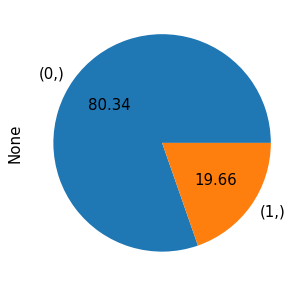

In [36]:
# Show pie plot (Approach 1)
target.value_counts().plot.pie(autopct='%.2f')

In [37]:
target.describe()

,Target
count,6497.000000
mean,0.196552
std,0.397421
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


In [38]:
target["Target"].unique()

array([0, 1])

In [39]:
# Raw numbers
target["Target"][target["Target"] == 0].count()
target["Target"][target["Target"] == 1].count()

1277

In [40]:
target_0_p = target["Target"][target["Target"] == 0].count()/target.shape[0]*100
target_1_p = target["Target"][target["Target"] == 1].count()/target.shape[0]*100

print("Percentage of target having entry=0: %.2f" % target_0_p)
print("Percentage of target having entry=1: %.2f" % target_1_p)

Percentage of target having entry=0: 80.34
Percentage of target having entry=1: 19.66



- The dataset is imbalanced on a basis of 20 to 80 which is quite severe.



## Outliers

In [41]:
def get_cat_num_df(df):
    """Get categorical and numerical features name.

    Parameters
    ----------
    df : pandas dataframe

    Returns
    -------
    cat_cols : list
    num_cols : list    
    """

    cat_cols = df.select_dtypes(include=['object'])
    num_cols = df.select_dtypes(exclude=['object'])
    print(
        f'The dataset contains {len(cat_cols.columns.tolist())} categorical columns')
    print(
        f'The dataset contains {len(num_cols.columns.tolist())} numeric columns')

    return cat_cols, num_cols

In [42]:
def detect_outliers(df, n, features, factor=1.5):
    """
    Takes a dataframe df and some features and returns a list of the indices
    corresponding to the observations containing more than n outliers according
    to the Tukey method.

    The outlier step was increased from 1.5 to 1.7 for better 
    performance.

    Parameters
    ----------
    df : pandas dataframe
    n : integer
        No of columns used to compute if the instance is an outlier for
        more than n features. This is an indication that it is more of an 
        outlier as this value is outside the range for more than one feature
    feature : list
    factor : float, default=1.5
        1.5 is the default used in the literature. Somtimes this it too restrictive
        and depending on the dataset used you may want to relax this by using a BIGGER value.

    Rerturns
    --------
    df : pandas dataframe

    References
    ----------
    https://en.wikipedia.org/wiki/Quartile
    """
    outlier_indices = []

    # iterate over features(columns)
    for col in features:
        # 1st quartile (25%)
        Q1 = np.percentile(df[col], 25)
        # 3rd quartile (75%)
        Q3 = np.percentile(df[col], 75)
        # Interquartile range (IQR)
        IQR = Q3 - Q1

        # outlier step
        outlier_step = factor * IQR

        # Determine a list of indices of outliers for feature col
        outlier_list_col = df[(df[col] < Q1 - outlier_step)
                              | (df[col] > Q3 + outlier_step)].index

        # append the found outlier indices for col to the list of outlier indices
        outlier_indices.extend(outlier_list_col)

        #print("Feature:", col, " No found", len(outlier_list_col))

    # Establish how many time an entry is present
    # Example -> Counter({277: 3, 615: 3, 981: 3, 538: 3,
    outlier_indices = Counter(outlier_indices)
    multiple_outliers_index = list(
        k for k, v in outlier_indices.items() if v > n)
    print("No of outliers: ", len(multiple_outliers_index))
    
    return df.iloc[multiple_outliers_index], multiple_outliers_index

In [43]:
cat_cols, num_cols = get_cat_num_df(pdf.drop(columns="Target"))

The dataset contains 2 categorical columns
The dataset contains 11 numeric columns


In [44]:
outliers, drop_index = detect_outliers(
    pdf, 2, num_cols, factor=1.5)

No of outliers:  0


In [45]:
outliers

,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Target


## Missing values



- Generally the threshold used to get rid of a features based on the number of missing values is anything in between **15 or 20%**.
- `Feature5` seems to have a lot of value missing. 
- As a first step, this feature is dropped and if time allowed some imputation could be tried to see if these missing values are recoverable or not.
- All the other features seem to have only some values missing. For this reason it is safe to drop the entire row.



In [46]:
pdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Feature1   6493 non-null   float64
 1   Feature2   6497 non-null   float64
 2   Feature3   6497 non-null   object 
 3   Feature4   6497 non-null   float64
 4   Feature5   805 non-null    float64
 5   Feature6   6497 non-null   float64
 6   Feature7   6487 non-null   float64
 7   Feature8   6495 non-null   float64
 8   Feature9   6497 non-null   object 
 9   Feature10  6488 non-null   float64
 10  Feature11  6494 non-null   float64
 11  Feature12  6495 non-null   float64
 12  Feature13  6497 non-null   float64
 13  Target     6497 non-null   int64  
dtypes: float64(11), int64(1), object(2)
memory usage: 710.7+ KB


In [47]:
def get_missing_values(df, threshold=20, verbose=False, sort_by='No missing value'):
    """Get basic details of the dataset.

    Missing values and their percentage
    Unique values and their percentage (Cardinality)
    Cardinality is important if you are trying to understand
    feature importance.
    Type if numerical or not

    Parameters
    ----------
    threshold - float [percentage]
        Used to highlihgt in yellow value that have
        a number of missing entries greater than the
        threshold
    verbose - float 
        If set to True values on console

    Returns
    -------
    df_null_values : pandas dataframe

    """

    print("\nChecking NON usable data")
    print("Threshold set at [%]", threshold)
    zero = False
    for i in df.columns:
        if df[i].isnull().sum() > 0.0:
            zero = True
            if verbose == True:
                print("%s | No missing: %.2f | Percentage %.2f" %
                      (i, df[i].isnull().sum(), df[i].isnull().mean()*100))

    if zero == False:
        print("No null values found!")

    # Pandas dataframe of the same print out shown above
    b = pd.DataFrame()
    b['No missing value'] = df.isnull().sum()
    b["Missing[%]"] = df.isna().mean()*100
    b['dtype'] = df.dtypes

    # Turn index into a columns
    b['Feature'] = b.index
    # Getting rid of the index
    b.reset_index(drop=True, inplace=True)
    # Order the entries, larger first

    b.sort_values(by=[sort_by], inplace=True, ascending=False)
    # Move feature as first column
    b = b[['Feature'] + [col for col in b.columns if col != 'Feature']]
    df_null_values = b

    # Highlihgt values > threshold)
    def highlight(x):
        return ['background: yellow' if v > threshold else '' for v in x]

    def bold(x):
        return ['font-weight: bold' if v > threshold else '' for v in x]

    # Visualise the highlighted df
    return df_null_values.style.apply(
        highlight, subset=["Missing[%]"]).apply(bold, subset=["Missing[%]"])

In [48]:
def plot_missing_values(df, threshold = 20):
    rcParams['font.size'] = 15
    plt.figure(figsize=(12, 10))
   
    #dummy = (df.loc[:, df.isnull().any()].isna().sum() / df.shape[0]).sort_values()
    #dummy.plot(kind='barh')
    missing = round(df.isnull().mean()*100,2)
    missing = missing[missing > 0]    
    missing.sort_values().plot(kind='barh')

    plt.axvline(x=threshold, color='r', linestyle='-', lw=4, label='Reference line')
    plt.legend()
    plt.xlabel('% of missing data', size=25)
    plt.show()

In [49]:
df_train_null_values = get_missing_values(pdf, threshold=0, verbose=False)


Checking NON usable data
Threshold set at [%] 0


In [50]:
df_train_null_values

,Feature,No missing value,Missing[%],dtype
4,Feature5,5692,87.609666,float64
6,Feature7,10,0.153917,float64
9,Feature10,9,0.138525,float64
0,Feature1,4,0.061567,float64
10,Feature11,3,0.046175,float64
7,Feature8,2,0.030783,float64
11,Feature12,2,0.030783,float64
1,Feature2,0,0.000000,float64
2,Feature3,0,0.000000,object
3,Feature4,0,0.000000,float64


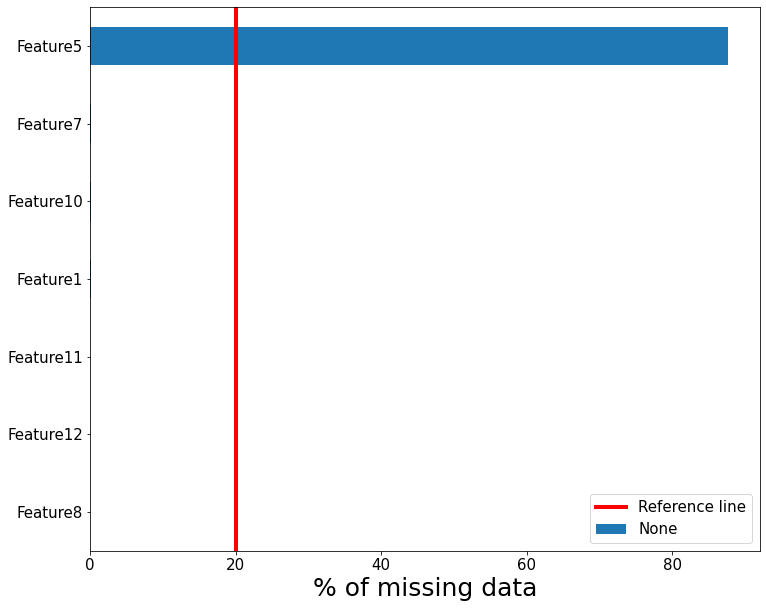

In [51]:
plot_missing_values(pdf)

# Data transformation
<hr style = "border:2px solid black" ></hr>


- Based on what it was discussed under the `EDA`section the final dataset is prepared.



In [52]:
pdf_new = pdf.drop(columns="Feature5")
# Sensor 3 has a single null entry: a minus sign as a string
pdf_new = pdf_new.replace("-", np.NaN)
pdf_new = pdf_new.dropna(how = 'any', axis = 0) 
pdf_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6463 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Feature1   6463 non-null   float64
 1   Feature2   6463 non-null   float64
 2   Feature3   6463 non-null   object 
 3   Feature4   6463 non-null   float64
 4   Feature6   6463 non-null   float64
 5   Feature7   6463 non-null   float64
 6   Feature8   6463 non-null   float64
 7   Feature9   6463 non-null   object 
 8   Feature10  6463 non-null   float64
 9   Feature11  6463 non-null   float64
 10  Feature12  6463 non-null   float64
 11  Feature13  6463 non-null   float64
 12  Target     6463 non-null   int64  
dtypes: float64(10), int64(1), object(2)
memory usage: 706.9+ KB


In [53]:
pdf.head(5)

,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Target
0,0.55,9.5,B,0.99740,NaN,32.0,10.0,1.90,0.58,3.13,0.22,0.080,9.0,0
1,0.32,12.7,A,0.99184,NaN,28.0,6.9,10.55,0.3,3.07,0.30,0.037,4.0,0
2,0.57,9.7,B,0.99743,NaN,86.0,7.2,2.30,0.66,3.53,0.03,0.078,16.0,0
3,0.50,9.5,B,0.99593,NaN,84.0,7.1,1.80,0.755,3.19,0.15,0.107,20.0,0
4,0.44,10.8,A,0.99280,NaN,127.0,7.0,4.90,0.29,3.17,0.37,0.034,26.0,0


In [54]:
pdf.shape

(6497, 14)

In [55]:
pdf_new = pd.get_dummies(pdf, columns=["Feature3"])
pdf_new.head(5)

,Feature1,Feature2,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Target,Feature3_A,Feature3_B
0,0.55,9.5,0.99740,NaN,32.0,10.0,1.90,0.58,3.13,0.22,0.080,9.0,0,0,1
1,0.32,12.7,0.99184,NaN,28.0,6.9,10.55,0.3,3.07,0.30,0.037,4.0,0,1,0
2,0.57,9.7,0.99743,NaN,86.0,7.2,2.30,0.66,3.53,0.03,0.078,16.0,0,0,1
3,0.50,9.5,0.99593,NaN,84.0,7.1,1.80,0.755,3.19,0.15,0.107,20.0,0,0,1
4,0.44,10.8,0.99280,NaN,127.0,7.0,4.90,0.29,3.17,0.37,0.034,26.0,0,1,0


In [56]:
pdf_new.shape

(6497, 15)

In [57]:
pdf_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Feature1    6493 non-null   float64
 1   Feature2    6497 non-null   float64
 2   Feature4    6497 non-null   float64
 3   Feature5    805 non-null    float64
 4   Feature6    6497 non-null   float64
 5   Feature7    6487 non-null   float64
 6   Feature8    6495 non-null   float64
 7   Feature9    6497 non-null   object 
 8   Feature10   6488 non-null   float64
 9   Feature11   6494 non-null   float64
 10  Feature12   6495 non-null   float64
 11  Feature13   6497 non-null   float64
 12  Target      6497 non-null   int64  
 13  Feature3_A  6497 non-null   uint8  
 14  Feature3_B  6497 non-null   uint8  
dtypes: float64(11), int64(1), object(1), uint8(2)
memory usage: 672.7+ KB


In [58]:
pdf_new = pdf_new.replace("-", np.NaN)
pdf_new = pdf_new.dropna(how = 'any', axis = 0) 

In [59]:
pdf_new = pdf_new.astype("float")

In [60]:
pdf_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 802 entries, 13 to 6495
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Feature1    802 non-null    float64
 1   Feature2    802 non-null    float64
 2   Feature4    802 non-null    float64
 3   Feature5    802 non-null    float64
 4   Feature6    802 non-null    float64
 5   Feature7    802 non-null    float64
 6   Feature8    802 non-null    float64
 7   Feature9    802 non-null    float64
 8   Feature10   802 non-null    float64
 9   Feature11   802 non-null    float64
 10  Feature12   802 non-null    float64
 11  Feature13   802 non-null    float64
 12  Target      802 non-null    float64
 13  Feature3_A  802 non-null    float64
 14  Feature3_B  802 non-null    float64
dtypes: float64(15)
memory usage: 100.2 KB


## Bird-eyes view of the data


- Before building a machine learning model it is often a good idea to inspect the data visually in order to:
    - To see if the task is easily solvable **without** machine learning.
    - To see if the desired information might not be contained in the data.
    - To see how many variable are linearly or non-linearly correlated to each other.



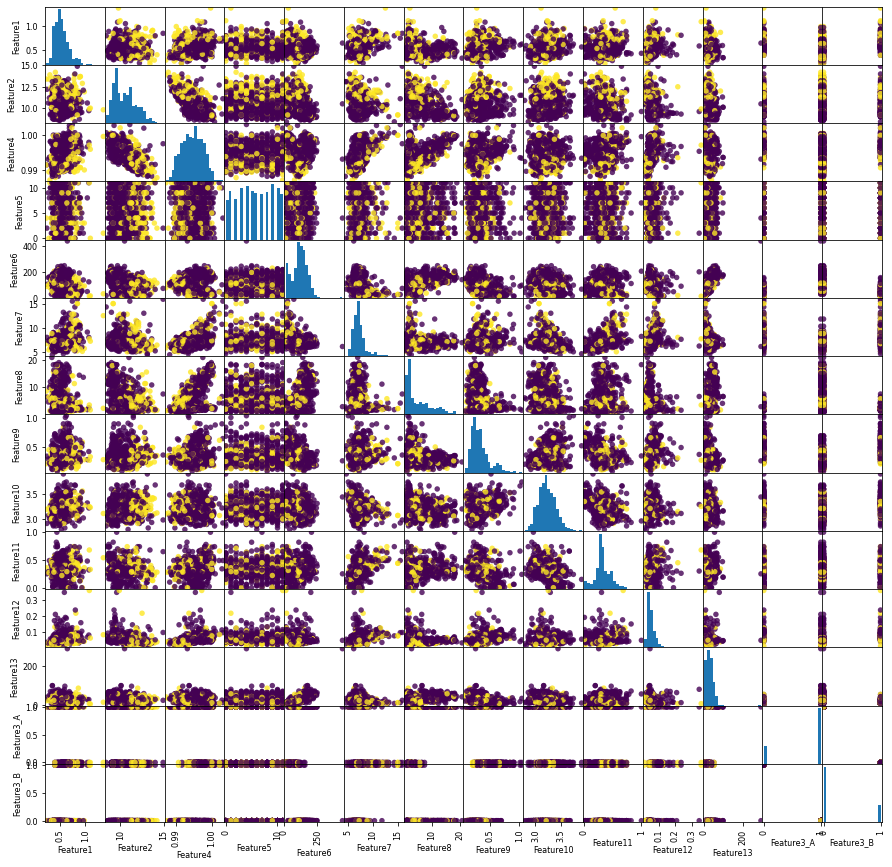

In [61]:
rcParams['font.size'] = 8
pd.plotting.scatter_matrix(pdf_new.drop(columns="Target"), c=pdf_new["Target"], figsize=(15, 15),
                           marker='o', hist_kwds={'bins': 20}, s=30,
                           alpha=.8)

plt.show()

# Features selection
<hr style = "border:2px solid black" ></hr>


- The goal of this section is twofolds:
    - Firstly, use PCA to get a feeling of the minimum number of features we need to model the dataset.
    - Secondly, understand how many features are correlated.
    
- ALthough, I have used all the features in my models. This analysis helped me understand more the dataset.



## PCA


- **Why standardise the features?** 

- **Recall** that PCA is essentially a variance maximising exercise. It projects your original data onto directions which maximize the variance. 
    
- If some variables have a large variance and some small, PCA (maximizing variance) will load on the large variances. For example if you change one variable from km to cm (increasing its variance), it may go from having little impact to dominating the first principle component. If you want your PCA to be independent of such rescaling, standardizing the variables will do that.
    
- Mean centering is done via scaling in order to ensure that the first Principal Component is in the **direction of maximum variance**.

- **Confusion point: Normalisation or standardisation?** Watch out: normalize in statistics sometimes carries the meaning of transform to be closer to a normal or Gaussian distribution. In this case, PCA and how it uses variance, it is better to talk of *standardising* when what is meant is scaling by (value - mean)/SD (or some other specified standardisation). 
    


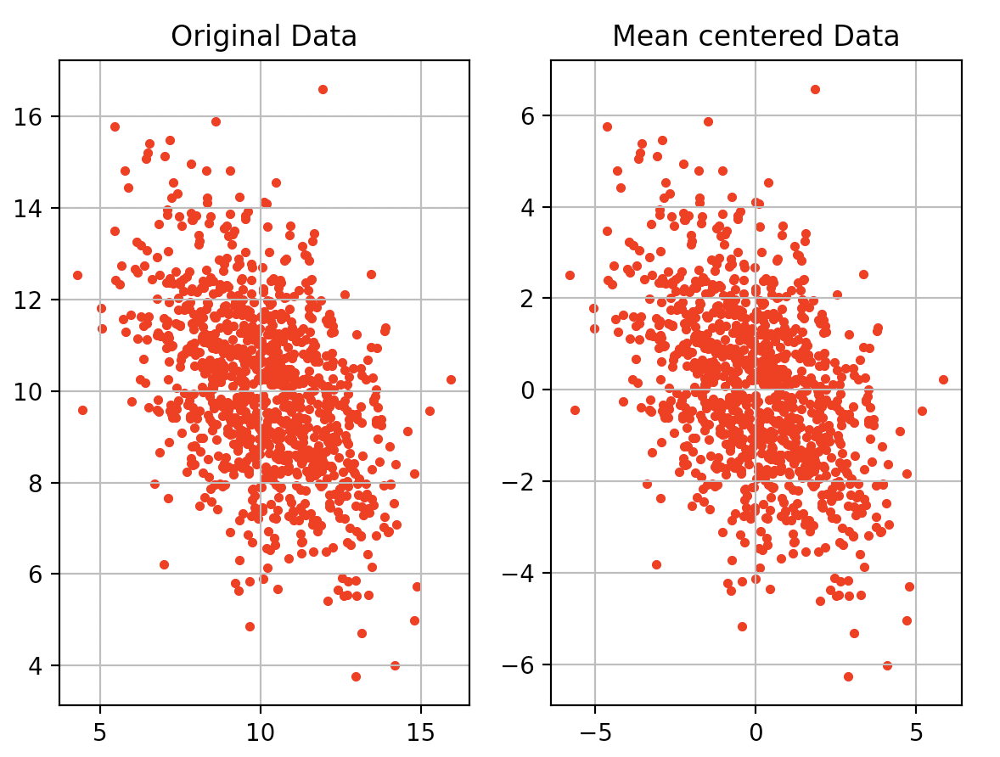

In [62]:
pdf_new.shape

(802, 15)

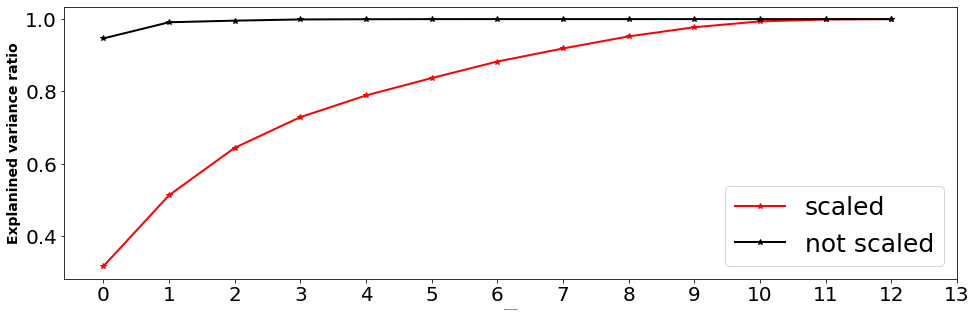

In [63]:
plt.figure(figsize=(16, 5))
rcParams['font.size'] = 20
# Robust scaler works even if the data are not eccesively skewed
rbst_scaler = RobustScaler()

dummy = pdf_new.drop(columns="Target")

pdf_new_scaled = rbst_scaler.fit_transform(dummy)

pca_scaled = PCA(13).fit(pdf_new_scaled)
pca = PCA(13).fit(dummy)

#pca = PCA(14).fit(pdf_new)
plt.plot(pca_scaled.explained_variance_ratio_.cumsum(),
         "r*-", lw=2, label="scaled")
plt.plot(pca.explained_variance_ratio_.cumsum(),
         "k*-", lw=2, label="not scaled")
plt.xticks(np.arange(0, 14, 1))

plt.xlabel('Number of components', fontweight='bold', size=1)
plt.ylabel('Explanined variance ratio', fontweight='bold', size=14)

#train_pca = PCA(3).fit_transform(train_rbst)
plt.legend(fontsize=25)
plt.show()

In [64]:
# https://stackoverflow.com/questions/22984335/recovering-features-names-of-explained-variance-ratio-in-pca-with-sklearn
# do not consider the sign! It is irrilevant
from sklearn import preprocessing
pca_rank = pd.DataFrame(dummy.values, columns=dummy.columns)

# normalize data
data_scaled = pd.DataFrame(preprocessing.scale(dummy), columns=dummy.columns)

# PCA
pca = PCA(n_components=13)
pca.fit_transform(data_scaled)


def bold(x):
    return ['font-weight: bold' if abs(v) == max(abs(x)) else '' for v in x]


def highlight(x):
    return ['background: yellow' if abs(v) == max(abs(x)) else '' for v in x]


# Dump components relations with features:
a = pd.DataFrame(pca.components_, columns=data_scaled.columns,
                 index=['PC-'+str(i+1) for i in range(13)])
a.style.apply(highlight).apply(bold)

,Feature1,Feature2,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Feature3_A,Feature3_B
PC-1,-0.272943,-0.028200,-0.160111,0.015228,0.369480,-0.248743,0.212841,-0.309541,-0.150910,0.036598,-0.257714,0.287833,0.439293,-0.439293
PC-2,0.087928,-0.454505,0.540861,0.023982,0.191190,0.295533,0.379374,-0.049240,-0.241673,0.286091,0.212086,0.181443,-0.045767,0.045767
PC-3,0.071148,0.312147,-0.210927,-0.094428,-0.156600,0.424236,-0.191084,-0.285158,-0.438141,0.542537,-0.057167,-0.155398,0.063394,-0.063394
PC-4,-0.060212,-0.009426,-0.022878,0.986357,-0.047476,0.030457,-0.066187,-0.056235,-0.051515,0.022146,0.044433,-0.081256,0.014420,-0.014420
PC-5,0.555916,0.167425,-0.098105,0.075243,0.296914,-0.062748,-0.206949,-0.143573,0.387135,0.271205,0.168265,0.487124,-0.039216,0.039216
PC-6,-0.282717,-0.258719,-0.233286,-0.078737,0.082415,-0.109087,-0.438371,0.022496,-0.269577,-0.060598,0.694784,0.144685,0.023917,-0.023917
PC-7,0.041200,0.445735,-0.087716,0.069143,0.154758,0.116787,0.204234,0.542652,-0.449659,-0.204438,0.002920,0.396449,-0.078129,0.078129
PC-8,0.633256,-0.001229,-0.046618,-0.007441,-0.073529,-0.186722,0.191145,-0.273851,-0.342462,-0.413251,0.226279,-0.263479,0.134675,-0.134675
PC-9,-0.140052,0.371765,0.009731,-0.003259,-0.066028,-0.314165,0.464055,0.135340,0.196466,0.385609,0.487899,-0.253810,0.088287,-0.088287
PC-10,0.289865,-0.294507,-0.070094,0.012128,0.228348,-0.135412,-0.216133,0.608940,-0.073685,0.297172,-0.169156,-0.325617,0.232167,-0.232167


In [65]:
a = pd.DataFrame(pca.components_, columns=data_scaled.columns,
                 index=['PC-'+str(i+1) for i in range(13)])
b = pd.DataFrame(a.abs().sum(axis=0))
b
#b.sort_values(by = "0",inplace=True, ascending=False)

,0
Feature1,2.623837
Feature2,3.024361
Feature4,2.345997
Feature5,1.402231
Feature6,2.759352
Feature7,2.979365
Feature8,3.115518
Feature9,2.690081
Feature10,3.197328
Feature11,2.837179


## Correlation btw features

    
- In pandas the default option `pearson` which captures only linear relationship. A bette choices would haved been either `kendal` or `Spearman`.

- Here are a small description of what other options are available:

    - **Kendall correlation**: is an ordinal correlation metric that is reasonably robust to gross outliers but highly sensitive to tiny variations in rank.
    - **Nonparametric correlation** is a correlation metric that doesn’t tacitly assume a specific form for the relationship between two variables. Kendall and Spearman correlations are examples, since they only assume that the relationship is monotonic.
    - **Pearson correlation** is the usual definition of correlation. Technically, Corr[X,Y] = Cov[X,Y]/(Std[X] * Std[Y]).
    - **Distance correlation**bears some resemblance to Pearson’s r, but is actually calculated using a rather different notion of covariance. The method works by replacing our everyday concepts of covariance and standard deviation (as defined above) with “distance” analogues.
    - **Spearman correlation** is an ordinal correlation metric that is robust to small changes in ordering but can get thrown off badly by outliers.  



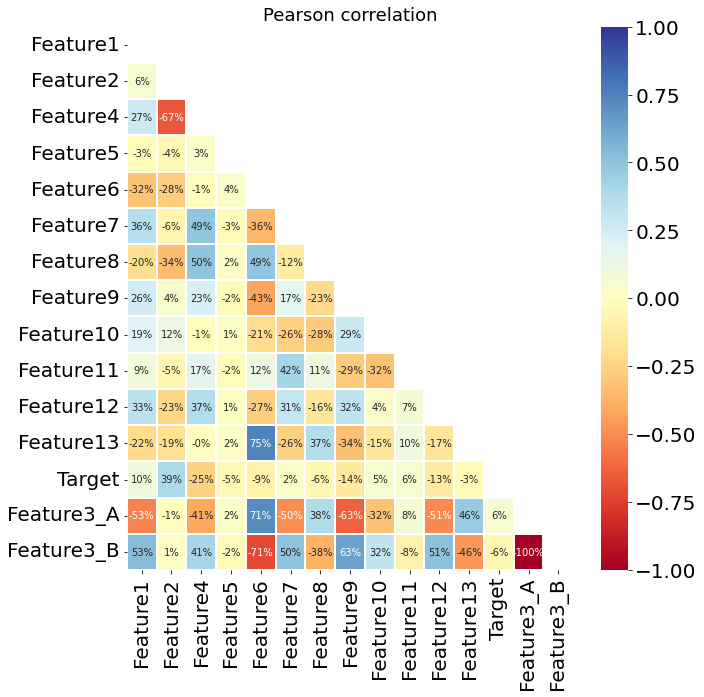

In [66]:
corr = pdf_new.corr()
plt.figure(figsize=(10, 10))
#rcParams['font.size'] = 20
plt.title('Pearson correlation', fontsize=18)
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, cmap='RdYlBu',
            linewidths=0.2, annot_kws={'size': 10}, mask=mask,  fmt='.0%', vmin=-1, vmax=1)
plt.show()

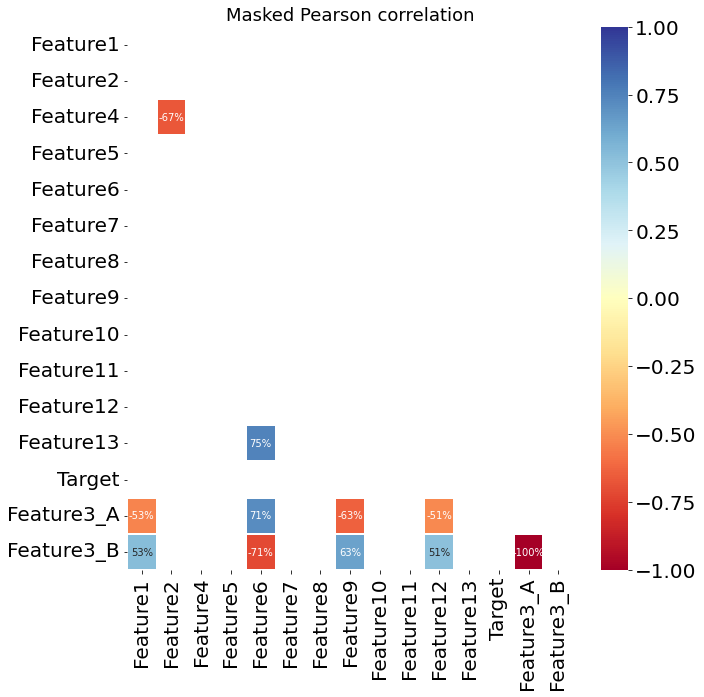

In [67]:
rcParams['font.size'] = 20
plt.figure(figsize=(10, 10))
plt.title('Masked Pearson correlation', fontsize=18)
sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.5)], annot=True, cmap='RdYlBu',
            linewidths=0.2, annot_kws={'size': 10}, mask=mask,  fmt='.0%', vmin=-1, vmax=1)
plt.show()

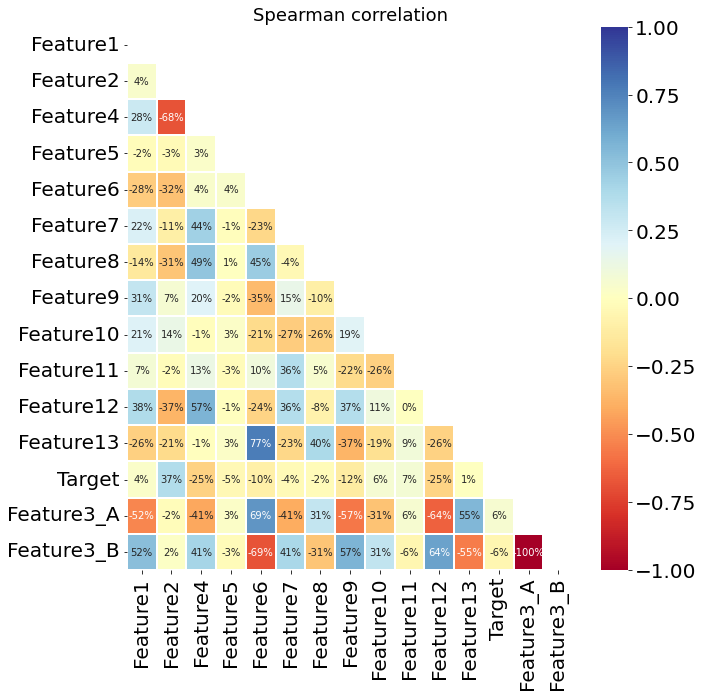

In [68]:
corr = pdf_new.corr(method="spearman")
plt.figure(figsize=(10, 10))
#rcParams['font.size'] = 20
plt.title('Spearman correlation', fontsize=18)
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, cmap='RdYlBu',
            linewidths=0.2, annot_kws={'size': 10}, mask=mask,  fmt='.0%', vmin=-1, vmax=1)
plt.show()

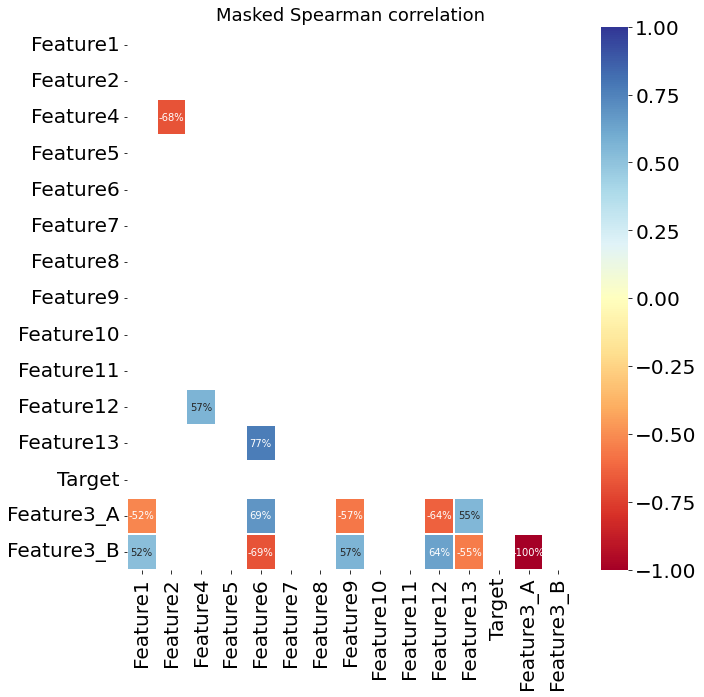

In [69]:
plt.figure(figsize=(10, 10))
plt.title('Masked Spearman correlation', fontsize=18)
sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.5)], annot=True, cmap='RdYlBu',
            linewidths=0.2, annot_kws={'size': 10}, mask=mask,  fmt='.0%', vmin=-1, vmax=1)
plt.show()

# Splitting the dataset
<hr style = "border:2px solid black" ></hr>

In [70]:
pdf_new_train, pdf_new_test, y_train, y_test = train_test_split(
    pdf_new.drop(columns="Target"),
    pdf_new["Target"],
    stratify=pdf_new["Target"],
    test_size=0.35, random_state=1)

print('training data dimension:', pdf_new_train.shape)
print('training data dimension:', pdf_new_test.shape)

training data dimension: (521, 14)
training data dimension: (281, 14)


In [71]:
print('Labels distribution in the TRAIN set:', (np.bincount(y_train) / y_train.size)*100)
print('Labels distribution in the TEST set:', (np.bincount(y_test) / y_test.size)*100)

Labels distribution in the TRAIN set: [77.3512476 22.6487524]
Labels distribution in the TEST set: [77.58007117 22.41992883]


In [72]:
label = pdf_new["Target"]

# Modelling
<hr style = "border:2px solid black" ></hr>


- `class_weightdict=‘balanced’` is used to balance the class. The class weights will be given by `n_samples / (n_classes * np.bincount(y)).`

- Only Logistic Regression and SVC need the inputs to be scaled.

- A single CV will be created and shared among all the methods.

- A stratified 5-fold cross-validation is used to ensure the proportion of binary examples found in the original distribution is respected in all the folds.



In [73]:
#kfold = KFold(n_splits=10, shuffle = True, random_state=7, test_size=0.5)
# https://machinelearningmastery.com/cross-validation-for-imbalanced-classification/
skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

In [74]:
def get_scores(model, skfold, X, X_train, y_train, X_test, y_test, name):

    model_fit = model.fit(X_train, y_train)
    # track the precision, recall and f1 score
    pred_test = model_fit.predict(X_test)
    pred_train = model_fit.predict(X_train)

    f1_test = f1_score(y_test, pred_test)
    f1_train = f1_score(y_train, pred_train)

    recall_test = recall_score(y_test, pred_test)
    recall_train = recall_score(y_train, pred_train)

    precision_test = precision_score(y_test, pred_test)
    precision_train = precision_score(y_train, pred_train)

    accuracy_test = accuracy_score(y_test, pred_test)
    accuracy_train = accuracy_score(y_train, pred_train)

    mcc_test = matthews_corrcoef(y_test, pred_test)
    mcc_train = matthews_corrcoef(y_train, pred_train)

    # CV score
    scoring = {
        'mcc': make_scorer(matthews_corrcoef),
        "recall": make_scorer(recall_score),
        "precision": make_scorer(precision_score),
        "f1": make_scorer(f1_score),
        "accuracy": make_scorer(accuracy_score)
    }

    results = cross_validate(model, X, label, cv=skfold, scoring=scoring)

    # Get pandas df for results
    table = pd.DataFrame()
    
    table["accuracy_test"] = [accuracy_test]
    table["accuracy_train"] = [accuracy_train]
    table["accuracy_CV"] = [results["test_accuracy"].mean()]

    table["recall_test"] = [recall_test]
    table["recall_train"] = [recall_train]
    table["recall_CV"] = [results["test_recall"].mean()]

    table["precision_test"] = [precision_test]
    table["precision_train"] = [precision_train]
    table["precision_CV"] = [results["test_precision"].mean()]

    table["F1_test"] = [f1_test]
    table["F1_train"] = [f1_train]
    table["F1_CV"] = [results["test_f1"].mean()]
    
    table["mcc_test"] = [mcc_test]
    table["mcc_train"] = [mcc_train]
    table["mcc_CV"] = [results["test_mcc"].mean()]    

    table = table.rename(index={0: name})

    return model_fit, table.T

In [75]:
X, X_train, X_test = pdf_new, pdf_new_train, pdf_new_test

In [76]:
def compare_cv_results(dfs):    
    """    
    It highlights the best value in each column
    
    Parameters
    ----------
    what : string, default="mean"
        Whether we'd like to filter the result by mean or
        standard deviation
        
    Returns
    -------
    dfs : pandas dataframe
        A highlighted pandas dataframe
    """
    
    dfs_ = pd.concat(dfs, axis=1)
    max_ = []
    for i in range(dfs_.shape[0]):
        max_.append(max(dfs_.values[i]))
    
    def highlight(x):
        return ['background: yellow' if v in max_ else '' for v in x]

    def bold(x):
        return ['font-weight: bold' if v  in max_ else '' for v in x]

    def colour(x):
        return ['color: red' if v  in max_ else '' for v in x]    
  
    return dfs_.style.apply(highlight).apply(bold).apply(colour)

## Logistic regression

In [77]:
lr_model = LogisticRegression(class_weight="balanced")
lr_model_fit, results_lr = get_scores(
    lr_model, skfold, X, X_train, y_train, X_test, y_test, "LR")
results_lr

,LR
accuracy_test,0.722420
accuracy_train,0.700576
accuracy_CV,1.000000
recall_test,0.825397
recall_train,0.711864
recall_CV,1.000000
precision_test,0.436975
precision_train,0.407767
precision_CV,1.000000
F1_test,0.571429


In [78]:
lr_model_scaled = make_pipeline(RobustScaler(), LogisticRegression(class_weight="balanced"))

lr_model_scaled_fit, results_lr_scaled = get_scores(
    lr_model_scaled, skfold, X, X_train, y_train, X_test, y_test, "LR_scaled")
results_lr_scaled

,LR_scaled
accuracy_test,0.725979
accuracy_train,0.721689
accuracy_CV,1.000000
recall_test,0.777778
recall_train,0.771186
recall_CV,1.000000
precision_test,0.437500
precision_train,0.435407
precision_CV,1.000000
F1_test,0.560000


In [79]:
dfs = [
results_lr,
results_lr_scaled,
]
compare_cv_results(dfs)

,LR,LR_scaled
accuracy_test,0.722420,0.725979
accuracy_train,0.700576,0.721689
accuracy_CV,1.000000,1.000000
recall_test,0.825397,0.777778
recall_train,0.711864,0.771186
recall_CV,1.000000,1.000000
precision_test,0.436975,0.437500
precision_train,0.407767,0.435407
precision_CV,1.000000,1.000000
F1_test,0.571429,0.560000


## k-nearest neighbours

- Number of cluster is unknown, default is k =3.

In [80]:
knn_model = KNeighborsClassifier()
knn_model_fit, results_knn = get_scores(
    knn_model, skfold, X, X_train, y_train, X_test, y_test, "KNN")
results_knn

,KNN
accuracy_test,0.722420
accuracy_train,0.823417
accuracy_CV,0.761825
recall_test,0.253968
recall_train,0.423729
recall_CV,0.270721
precision_test,0.340426
precision_train,0.675676
precision_CV,0.456057
F1_test,0.290909


## Decision tree

In [81]:
DT_model = DecisionTreeClassifier()
DT_model_fit, results_DT = get_scores(
    DT_model, skfold, X, X_train, y_train, X_test, y_test, "DT")
results_DT

,DT
accuracy_test,0.711744
accuracy_train,1.000000
accuracy_CV,1.000000
recall_test,0.460317
recall_train,1.000000
recall_CV,1.000000
precision_test,0.381579
precision_train,1.000000
precision_CV,1.000000
F1_test,0.417266


## Gradient boosting

In [82]:
# See this for the reason why there is no class_weight
# https://stackoverflow.com/questions/35539937/is-there-class-weight-or-alternative-way-for-gradientboostingclassifier-in-skl
gbm = GradientBoostingClassifier()
GBC_model_fit, results_gbc = get_scores(
    gbm, skfold, X, X_train, y_train, X_test, y_test, "GBC")
results_gbc

,GBC
accuracy_test,0.797153
accuracy_train,0.971209
accuracy_CV,1.000000
recall_test,0.444444
recall_train,0.881356
recall_CV,1.000000
precision_test,0.560000
precision_train,0.990476
precision_CV,1.000000
F1_test,0.495575


## SVC

In [83]:
SVC_model = SVC(kernel='rbf', class_weight='balanced', probability=True)
SVC_model_fit, results_svc = get_scores(
    SVC_model, skfold, X, X_train, y_train, X_test, y_test, "SVC")
results_svc

,SVC
accuracy_test,0.519573
accuracy_train,0.518234
accuracy_CV,0.487632
recall_test,0.777778
recall_train,0.745763
recall_CV,0.763063
precision_test,0.288235
precision_train,0.284790
precision_CV,0.273364
F1_test,0.420601


In [84]:
SVC_model_scaled = make_pipeline(RobustScaler(), SVC(
    kernel='rbf', class_weight='balanced', probability=True))

SVC_model_scaled_fit, results_svc_scaled = get_scores(
    SVC_model_scaled, skfold, X, X_train, y_train, X_test, y_test, "SVC_scaled")
results_svc_scaled

,SVC_scaled
accuracy_test,0.725979
accuracy_train,0.804223
accuracy_CV,0.993766
recall_test,0.825397
recall_train,0.915254
recall_CV,0.977928
precision_test,0.440678
precision_train,0.540000
precision_CV,0.994595
F1_test,0.574586


In [85]:
dfs = [
results_svc,
results_svc_scaled,
]
compare_cv_results(dfs)

,SVC,SVC_scaled
accuracy_test,0.519573,0.725979
accuracy_train,0.518234,0.804223
accuracy_CV,0.487632,0.993766
recall_test,0.777778,0.825397
recall_train,0.745763,0.915254
recall_CV,0.763063,0.977928
precision_test,0.288235,0.440678
precision_train,0.284790,0.540000
precision_CV,0.273364,0.994595
F1_test,0.420601,0.574586


## Random forest

In [86]:
RF_model = RandomForestClassifier(n_jobs=-1, class_weight="balanced")
RF_model_fit, results_RF = get_scores(RF_model, skfold, X, X_train, y_train, X_test, y_test, "RF")
results_RF

,RF
accuracy_test,0.807829
accuracy_train,1.000000
accuracy_CV,1.000000
recall_test,0.396825
recall_train,1.000000
recall_CV,1.000000
precision_test,0.609756
precision_train,1.000000
precision_CV,1.000000
F1_test,0.480769


## CatBoost


- CatBoost as in **Cat**egorical feature gradient **Boost**ing
- Highly accurate model building with great GPU or CPU training speed.
- The remarkable result with default parameters.
- It Works well with categorical variables (as the name itself suggests) and no need to preprocess them (like one-hot encoding).
- Cool Visualizations like Feature importance, training process visualization.
- Simple to use with Python package.



In [87]:
CAT_model = CatBoostClassifier(verbose=False)
CAT_model_fit, results_CAT = get_scores(
    CAT_model, skfold, X, X_train, y_train, X_test, y_test, "Cat")
results_CAT

,Cat
accuracy_test,0.804270
accuracy_train,0.982726
accuracy_CV,1.000000
recall_test,0.444444
recall_train,0.923729
recall_CV,1.000000
precision_test,0.583333
precision_train,1.000000
precision_CV,1.000000
F1_test,0.504505


## LightGBM


- With all of that being said LightGBM is a fast, distributed, high performance gradient boosting that was open-source by Microsoft around  August 2016. The main advantages of LightGBM includes:

    - Faster training speed and higher efficiency: LightGBM use histogram based algorithm i.e it buckets continuous feature values into discrete bins which fasten the training procedure.
    - Lower memory usage: Replaces continuous values to discrete bins which result in lower memory usage.
    - Better accuracy than any other boosting algorithm: It produces much more complex trees by following leaf wise split approach rather than a level-wise approach which is the main factor in achieving higher accuracy. However, it can sometimes lead to overfitting which can be avoided by setting the max_depth parameter.
    - Compatibility with Large Datasets: It is capable of performing equally good with large datasets with a significant reduction in training time as compared to XGBoost.
    - Parallel learning supported.



In [88]:
LGBM_model = LGBMClassifier(verbose=0)
LGBM_model_fit, results_LGBM = get_scores(
    LGBM_model, skfold, X, X_train, y_train, X_test, y_test, "LGBM")

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

In [89]:
results_LGBM

,LGBM
accuracy_test,0.818505
accuracy_train,1.000000
accuracy_CV,1.000000
recall_test,0.523810
recall_train,1.000000
recall_CV,1.000000
precision_test,0.611111
precision_train,1.000000
precision_CV,1.000000
F1_test,0.564103


## XGBoost


- Although XGBoost performs well in general, even on imbalanced classification datasets, it offers a way to tune the training algorithm to pay more attention to misclassification of the minority class for datasets with a skewed class distribution.
    
- This modified version of XGBoost is referred to as Class Weighted XGBoost or Cost-Sensitive XGBoost and can offer better performance on binary classification problems with a severe class imbalance.

- `scale_pos_weight` is a hyperparameter used to scale the positive weight. The emphasis here on positive is important because XGBoost assumes that a target value of 1 is positive and a target value of 0 is negative.



In [90]:
XGB_model = XGBClassifier(n_jobs = -1, verbosity = 0)
XGB_model_fit, results_XGB = get_scores(
    XGB_model, skfold, X, X_train, y_train, X_test, y_test, "XGB")

In [91]:
results_XGB

,XGB
accuracy_test,0.782918
accuracy_train,1.000000
accuracy_CV,1.000000
recall_test,0.492063
recall_train,1.000000
recall_CV,1.000000
precision_test,0.516667
precision_train,1.000000
precision_CV,1.000000
F1_test,0.504065


## Comparison


- A good classifier would have a PR (Precision/Recall) curve closer to the upper-right corner and a ROC curve to the upper-left corner. 

- Using DET curves over ROC curves may help distinguish plots in the ROC curves as they generally differ in the top left corner of the graph and appear similar for a large part of the plot. 
    


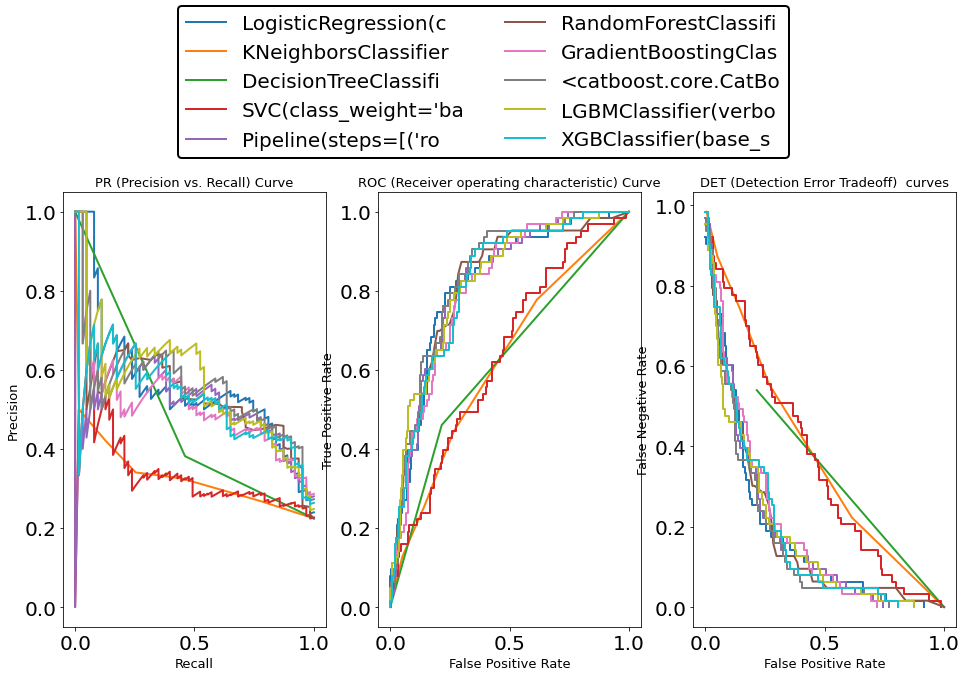

In [92]:
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 3, 1)

ax1.set_xlabel('Recall', size=13)
ax1.set_ylabel('Precision', size=13)
ax1.set_title('PR (Precision vs. Recall) Curve', size=13)

ax2 = fig.add_subplot(1, 3, 2)
ax2.set_xlabel('False Positive Rate', size=13)
ax2.set_ylabel('True Positive Rate', size=13)
ax2.set_title('ROC (Receiver operating characteristic) Curve', size=13)

ax3 = fig.add_subplot(1, 3, 3)
ax3.set_xlabel('False Positive Rate', size=13)
ax3.set_ylabel('False Negative Rate', size=13)
ax3.set_title('DET (Detection Error Tradeoff)  curves', size=13)

models = [
lr_model_fit,
knn_model_fit,
DT_model_fit, 
SVC_model_fit,
SVC_model_scaled_fit,
RF_model_fit,
GBC_model_fit,
CAT_model_fit,
LGBM_model_fit,
XGB_model_fit
]


for model_temp in models:
    # plot the precision-recall curve and AUC curve
    pred_prob = model_temp.predict_proba(X_test)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, pred_prob)
    tpr, fpr, _ = roc_curve(y_test, pred_prob)
    fpr_, fnr_, _ = det_curve(y_test, pred_prob)

    ax1.plot(recall, precision, lw=2, label=str(model_temp)[:20])
    ax2.plot(tpr, fpr, lw=2)
    ax3.plot(fpr_, fnr_, lw=2)
    


legendObject = ax1.legend(loc='upper center', bbox_to_anchor=(1.6, 1.45),
                          ncol=2, fontsize=20, fancybox=True, shadow=False,
                          facecolor="w", framealpha=1)
legendObject.get_frame().set_linewidth(2.0)
legendObject.get_frame().set_edgecolor("k")

#plt.tight_layout()
plt.show()

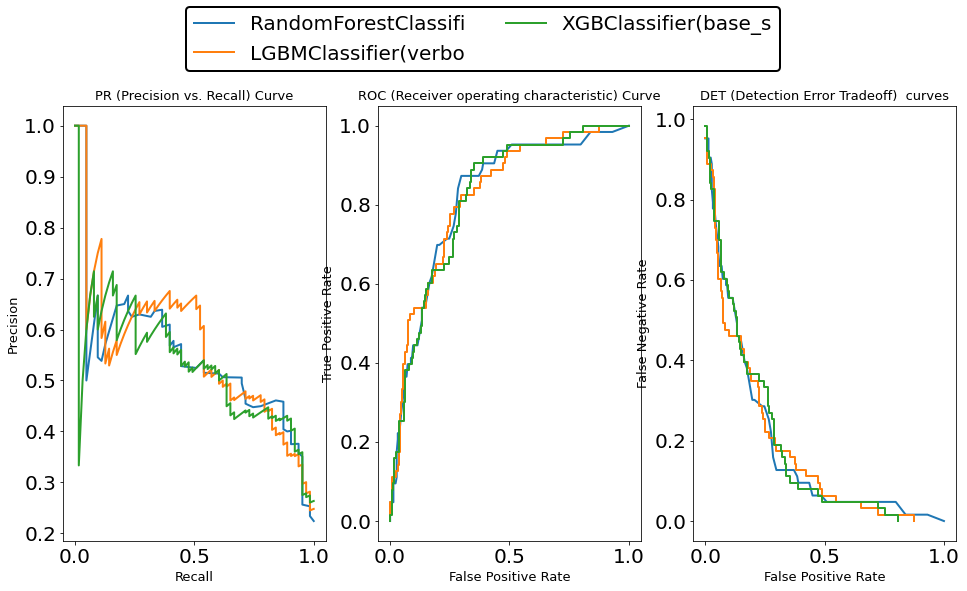

In [93]:
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 3, 1)

ax1.set_xlabel('Recall', size=13)
ax1.set_ylabel('Precision', size=13)
ax1.set_title('PR (Precision vs. Recall) Curve', size=13)

ax2 = fig.add_subplot(1, 3, 2)
ax2.set_xlabel('False Positive Rate', size=13)
ax2.set_ylabel('True Positive Rate', size=13)
ax2.set_title('ROC (Receiver operating characteristic) Curve', size=13)

ax3 = fig.add_subplot(1, 3, 3)
ax3.set_xlabel('False Positive Rate', size=13)
ax3.set_ylabel('False Negative Rate', size=13)
ax3.set_title('DET (Detection Error Tradeoff)  curves', size=13)

models = [
RF_model_fit,
LGBM_model_fit,
XGB_model_fit
]


for model_temp in models:
    # plot the precision-recall curve and AUC curve
    pred_prob = model_temp.predict_proba(X_test)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, pred_prob)
    tpr, fpr, _ = roc_curve(y_test, pred_prob)
    fpr_, fnr_, _ = det_curve(y_test, pred_prob)

    ax1.plot(recall, precision, lw=2, label=str(model_temp)[:20])
    ax2.plot(tpr, fpr, lw=2)
    ax3.plot(fpr_, fnr_, lw=2)
    


legendObject = ax1.legend(loc='upper center', bbox_to_anchor=(1.6, 1.25),
                          ncol=2, fontsize=20, fancybox=True, shadow=False,
                          facecolor="w", framealpha=1)
legendObject.get_frame().set_linewidth(2.0)
legendObject.get_frame().set_edgecolor("k")

#plt.tight_layout()
plt.show()

In [94]:
dfs = [
results_RF,
results_svc,
results_svc_scaled,
results_DT, 
results_knn, 
results_lr, 
results_lr_scaled,
results_gbc,
results_CAT,
results_LGBM
]
compare_cv_results(dfs)

,RF,SVC,SVC_scaled,DT,KNN,LR,LR_scaled,GBC,Cat,LGBM
accuracy_test,0.807829,0.519573,0.725979,0.711744,0.722420,0.722420,0.725979,0.797153,0.804270,0.818505
accuracy_train,1.000000,0.518234,0.804223,1.000000,0.823417,0.700576,0.721689,0.971209,0.982726,1.000000
accuracy_CV,1.000000,0.487632,0.993766,1.000000,0.761825,1.000000,1.000000,1.000000,1.000000,1.000000
recall_test,0.396825,0.777778,0.825397,0.460317,0.253968,0.825397,0.777778,0.444444,0.444444,0.523810
recall_train,1.000000,0.745763,0.915254,1.000000,0.423729,0.711864,0.771186,0.881356,0.923729,1.000000
recall_CV,1.000000,0.763063,0.977928,1.000000,0.270721,1.000000,1.000000,1.000000,1.000000,1.000000
precision_test,0.609756,0.288235,0.440678,0.381579,0.340426,0.436975,0.437500,0.560000,0.583333,0.611111
precision_train,1.000000,0.284790,0.540000,1.000000,0.675676,0.407767,0.435407,0.990476,1.000000,1.000000
precision_CV,1.000000,0.273364,0.994595,1.000000,0.456057,1.000000,1.000000,1.000000,1.000000,1.000000
F1_test,0.480769,0.420601,0.574586,0.417266,0.290909,0.571429,0.560000,0.495575,0.504505,0.564103


# Hyperparameters tuning
<hr style = "border:2px solid black" ></hr>


- After evaluating 10 methods, 3 methods are selected for a further analisys.

- In this section the hyperparameters are tuned to see if can squeeze some more performance out of the model.

- It is now time to decide which metric the models are going to be optimised against. I'll restrict my attention on three of the most used: precision, recall and the f1 score. Accuracy is not even consider here because the dataset is highly imbalanced.

    - Precision: it’s the division of the positive cases correctly identified by all the cases identified as positive (including false-positives).    
    - Recall (or sensitivity): it’s the division of the true-positives by all the real positive cases (including false-negative cases). It matters when you are trying to have more true-positives than true-negatives.
    - F1 Score: it’s the combination of the sensitivity and the recall. 

        
- Considering that F1 is used when a balance between precision and recall is sought, I decided to optimised the model **against the recall metric** because, if my intuition is correct, then I'd prefer to have a model biased towards true-positive. This is based on my intuition about the dataset and, of course, this is not written in stone.
    


In [95]:
def tune_model(model, param_grid, cv, grid_type, metric_to_optimise):
    """Tune model.
    
    Paramters
    ---------
    model
    param_grid
    grid_type = "random"
    metric_to_optimise="f1"
    
    Returns
    -------
    grid.best_params_
    """
    
    if grid_type != "random":
        grid = GridSearchCV(model, param_grid, cv=cv,  n_jobs=-1, scoring=metric_to_optimise)
    else:
        grid = RandomizedSearchCV(model, param_grid, cv=cv, n_jobs=-1, scoring=metric_to_optimise)
    
    grid.fit(X, label) 
    
    return grid.best_params_

In [96]:
def compare_default_vs_tune(model_default, model_tuned):
    
    fig = plt.figure(figsize=(15, 5))
    ax1 = fig.add_subplot(1, 2, 1)

    ax1.set_xlabel('Recall')
    ax1.set_ylabel('Precision')
    ax1.set_title('PR Curve')

    ax2 = fig.add_subplot(1, 2, 2)
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC Curve')

    models = [model_default.fit(X_train, y_train), model_tuned.fit(X_train, y_train)]
    labels = ["default", "tuned"]


    for i, model_temp in enumerate(models):
        # plot the precision-recall curve and AUC curve
        pred_prob = model_temp.predict_proba(X_test)[:, 1]
        precision, recall, _ = precision_recall_curve(y_test, pred_prob)
        tpr, fpr, _ = roc_curve(y_test, pred_prob)

        ax1.plot(recall, precision, lw=3, label=labels[i])
        ax2.plot(tpr, fpr, lw=3, label=labels[i])


    ax1.legend(loc='lower left')
    ax2.legend(loc='lower right')

    plt.show()
    
    # Return the tuned model
    return models[1]

In [97]:
chosen_metric = "recall"

## XGBoost

In [98]:
# Get default paramters
XGB_model.get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': True,
 'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'enable_categorical': False,
 'gamma': 0,
 'gpu_id': -1,
 'importance_type': None,
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_delta_step': 0,
 'max_depth': 6,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 100,
 'n_jobs': -1,
 'num_parallel_tree': 1,
 'predictor': 'auto',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'validate_parameters': 1,
 'verbosity': 0}

In [99]:
params_grid_XGB = {'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.25, 1, 1.5],
                   'n_estimators': [100, 500, 600, 700],
                   'max_depth': [1, 2, 3, 4, 5, 6, 7, 10]
                   }

In [100]:
XGB_model = XGBClassifier(n_jobs = -1, verbosity = 0, use_label_encoder=False)
best_params_XGB = tune_model(XGB_model, params_grid_XGB, skfold, "random", chosen_metric)

/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a f

/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int6

/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/opt/anaconda3/envs/trainingAI/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


In [101]:
best_params_XGB

{'n_estimators': 700, 'max_depth': 4, 'learning_rate': 0.05}

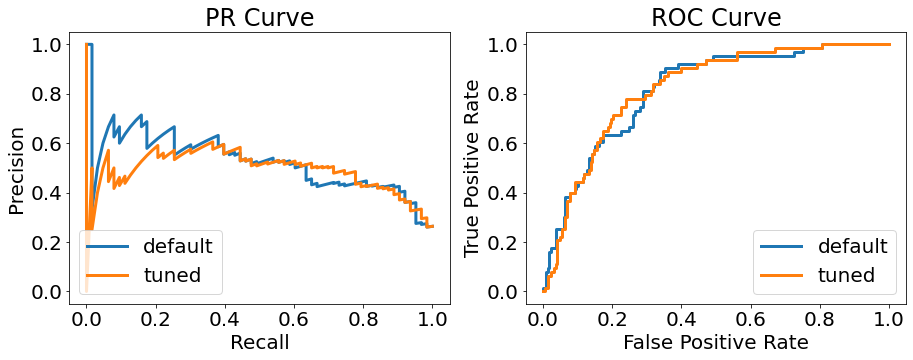

In [102]:
XGB_model_tuned = compare_default_vs_tune(XGB_model, XGBClassifier(
    n_jobs=-1, verbosity=0, **best_params_XGB))

In [103]:
XGB_model_tuned = XGBClassifier(n_jobs=-1, verbosity=0, **best_params_XGB)
XGB_model_tuned_fit, results_XGB_tuned = get_scores(
    XGB_model_tuned, skfold, X, X_train, y_train, X_test, y_test, "XGB_tuned")

In [104]:
dfs = [
results_XGB,
results_XGB_tuned,
]
compare_cv_results(dfs)

,XGB,XGB_tuned
accuracy_test,0.782918,0.790036
accuracy_train,1.000000,1.000000
accuracy_CV,1.000000,1.000000
recall_test,0.492063,0.476190
recall_train,1.000000,1.000000
recall_CV,1.000000,1.000000
precision_test,0.516667,0.535714
precision_train,1.000000,1.000000
precision_CV,1.000000,1.000000
F1_test,0.504065,0.504202


## LightGBM

In [105]:
# Instantiate new model
LGBM_model = LGBMClassifier(verbose=0, n_jobs=-1)
# Get default paramters
LGBM_model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'verbose': 0}

In [106]:
params_grid_LGBM = {
    'max_depth' : [3, 10, 15, 20, 30],
    'learning_rate' : [0.01, 0.1, 1, 2, 3, 5, 10, 12],
    'n_estimators' : [100, 300, 500, 1000, 2000, 3000],    
}

In [107]:
best_params_LGBM = tune_model(
    LGBM_model, params_grid_LGBM, skfold, "random", chosen_metric)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

In [108]:
best_params_LGBM

{'n_estimators': 300, 'max_depth': 10, 'learning_rate': 3}

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

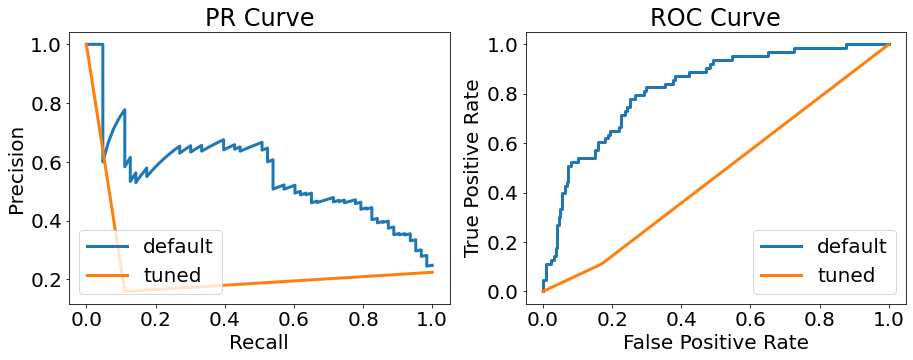

In [109]:
LGBM_model_tuned = compare_default_vs_tune(LGBM_model, LGBMClassifier(
    n_jobs=-1, verbosity=0, **best_params_LGBM))

In [110]:
LGBM_model_tuned = LGBMClassifier(n_jobs=-1, verbosity=0, **best_params_LGBM)
LGBM_model_tuned_fit, results_LGBM_tuned = get_scores(
    LGBM_model_tuned, skfold, X, X_train, y_train, X_test, y_test, "LGBM_tuned")

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [111]:
results_LGBM_tuned

,LGBM_tuned
accuracy_test,0.669039
accuracy_train,0.687140
accuracy_CV,1.000000
recall_test,0.111111
recall_train,0.186441
recall_CV,1.000000
precision_test,0.159091
precision_train,0.247191
precision_CV,1.000000
F1_test,0.130841


In [112]:
dfs = [
results_LGBM,
results_LGBM_tuned,
]
compare_cv_results(dfs)

,LGBM,LGBM_tuned
accuracy_test,0.818505,0.669039
accuracy_train,1.000000,0.687140
accuracy_CV,1.000000,1.000000
recall_test,0.523810,0.111111
recall_train,1.000000,0.186441
recall_CV,1.000000,1.000000
precision_test,0.611111,0.159091
precision_train,1.000000,0.247191
precision_CV,1.000000,1.000000
F1_test,0.564103,0.130841


## Random forest

In [113]:
# Instantiate new model
RF_model = RandomForestClassifier(n_jobs=-1, class_weight="balanced")
# Get default paramters
RF_model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [114]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 500, num = 5)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]

# Convert to dictionary
params_grid_RF = dict(n_estimators=n_estimators,
                 max_features = max_features,
                 max_depth = max_depth,
                 min_samples_split = min_samples_split,
                 min_samples_leaf = min_samples_leaf 
                 )

In [115]:
best_params_RF = tune_model(
    RF_model, params_grid_RF, skfold, "random", chosen_metric)

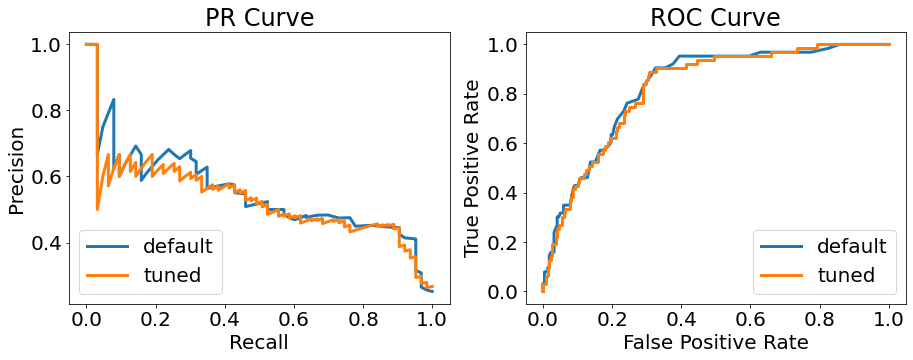

In [116]:
RF_model_tuned = compare_default_vs_tune(RF_model, RandomForestClassifier(
    n_jobs=-1, class_weight="balanced", **best_params_RF))

In [117]:
RF_model_tuned = RandomForestClassifier(
    n_jobs=-1, class_weight="balanced", **best_params_RF)

RF_model_tuned_fit, results_RF_tuned = get_scores(
    RF_model_tuned, skfold, X, X_train, y_train, X_test, y_test, "RF_tuned")
results_RF.T

,accuracy_test,accuracy_train,accuracy_CV,recall_test,recall_train,recall_CV,precision_test,precision_train,precision_CV,F1_test,F1_train,F1_CV,mcc_test,mcc_train,mcc_CV
RF,0.807829,1.0,1.0,0.396825,1.0,1.0,0.609756,1.0,1.0,0.480769,1.0,1.0,0.382105,1.0,1.0


In [118]:
dfs = [
results_RF,
results_RF_tuned,
]
compare_cv_results(dfs)

,RF,RF_tuned
accuracy_test,0.807829,0.779359
accuracy_train,1.000000,0.992322
accuracy_CV,1.000000,1.000000
recall_test,0.396825,0.444444
recall_train,1.000000,1.000000
recall_CV,1.000000,1.000000
precision_test,0.609756,0.509091
precision_train,1.000000,0.967213
precision_CV,1.000000,1.000000
F1_test,0.480769,0.474576


## Comparison

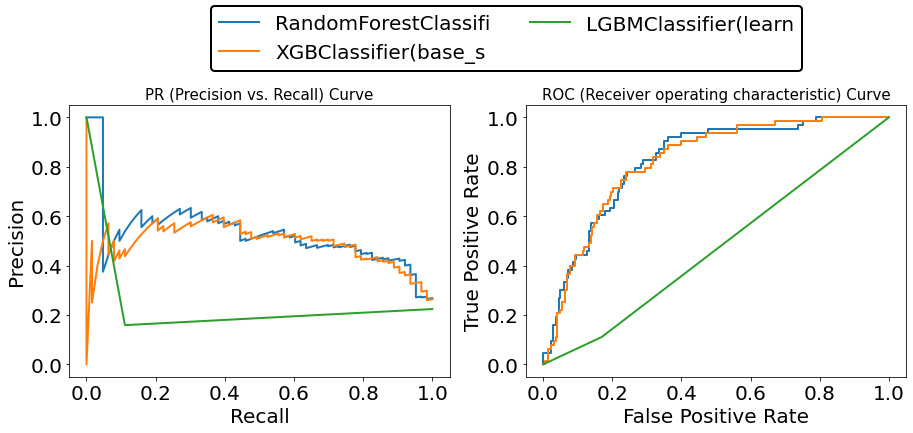

In [119]:
fig = plt.figure(figsize=(15, 5))
ax1 = fig.add_subplot(1, 2, 1)

ax1.set_xlabel('Recall')
ax1.set_ylabel('Precision')
ax1.set_title('PR (Precision vs. Recall) Curve', size =15)

ax2 = fig.add_subplot(1, 2, 2)
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('ROC (Receiver operating characteristic) Curve', size =15)

models = [
RF_model_tuned,
XGB_model_tuned,
LGBM_model_tuned
]

for model_temp in models:
    # plot the precision-recall curve and AUC curve
    pred_prob = model_temp.predict_proba(X_test)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, pred_prob)
    tpr, fpr, _ = roc_curve(y_test, pred_prob)

    ax1.plot(recall, precision, lw=2, label=str(model_temp)[:20])
    ax2.plot(tpr, fpr, lw=2, label=str(model_temp))


legendObject = ax1.legend(loc = 'upper center', bbox_to_anchor=(1.15, 1.4),
          ncol = 2, fontsize = 20, fancybox = True, shadow = False,
          facecolor = "w", framealpha = 1)
legendObject.get_frame().set_linewidth(2.0)
legendObject.get_frame().set_edgecolor("k")

plt.show()

In [120]:
dfs = [
results_XGB_tuned,
results_LGBM_tuned,
results_RF_tuned,
]
compare_cv_results(dfs)

,XGB_tuned,LGBM_tuned,RF_tuned
accuracy_test,0.790036,0.669039,0.779359
accuracy_train,1.000000,0.687140,0.992322
accuracy_CV,1.000000,1.000000,1.000000
recall_test,0.476190,0.111111,0.444444
recall_train,1.000000,0.186441,1.000000
recall_CV,1.000000,1.000000,1.000000
precision_test,0.535714,0.159091,0.509091
precision_train,1.000000,0.247191,0.967213
precision_CV,1.000000,1.000000,1.000000
F1_test,0.504202,0.130841,0.474576



- These last three tuned classifier all have similar performance with the exception of `LGBM_tuned` probably due to a poor choice of hyperparameter space.

- Without knowing more about the problem, it would premature for me to express a preference for one of them.



# If I had the domain knowledge
<hr style = "border:2px solid black" ></hr>


- We have seen how we tried to balance the dataset. However, this was done in a blind manner as I am unable to judge if class with target=0 is more or less important than class with target=1.

- In this case, it would be beneficial to provide a way to bias the model on purpouse. Here the term "bias" means a way to force to model to prioritise one class over the other. Generally this is a decision made by the domain knowledge expert.

- Below I offered a small snippet that visualise this concept with an **untuned** Logisitc Regression model. However the same is valid for any other model. This can be achived in scikit-learn via the `class_weight` attribute. We can give higher weights to the minority class (the model will be penalized more when misclassifying a minority class).



In [121]:
f1_scores = []
recall_scores = []
precision_scores = []

# Select a series of weights
pos_weights = [1, 1.5, 2, 2.5, 5, 10]
for pos_weight in pos_weights:
    lr_model = LogisticRegression(class_weight={0: 1, 1: pos_weight})
    lr_model.fit(X_train, y_train)

    # plot the precision-recall curve and AUC curve
    pred_prob = lr_model.predict_proba(X_test)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, pred_prob)
    tpr, fpr, _ = roc_curve(y_test, pred_prob)

    # track the precision, recall and f1 score
    pred = lr_model.predict(X_test)
    f1_test = f1_score(y_test, pred)
    recall_test = recall_score(y_test, pred)
    precision_test = precision_score(y_test, pred)
    f1_scores.append(f1_test)
    recall_scores.append(recall_test)
    precision_scores.append(precision_test)

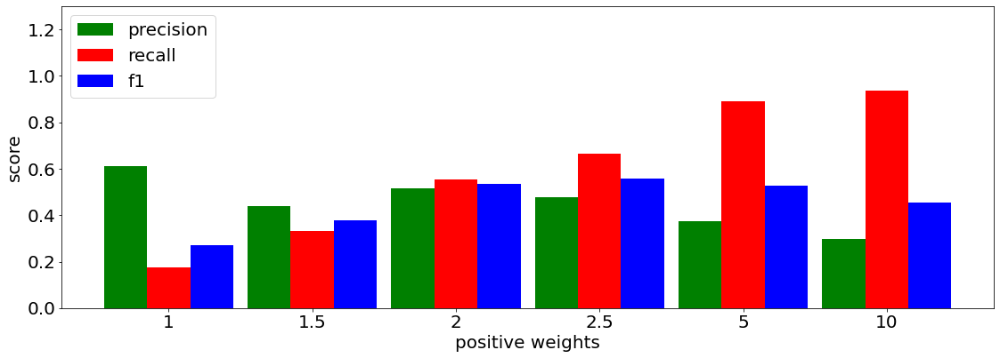

In [122]:
def score_barplot(precision_scores, recall_scores, f1_scores, pos_weights, figsize=(16, 6)):
    """Visualize precision/recall/f1 score at different class weighting values."""
    width = 0.3
    ind = np.arange(len(precision_scores))
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    b1 = ax.bar(ind, precision_scores, width, color='g')
    b2 = ax.bar(ind + width, recall_scores, width, color='r')
    b3 = ax.bar(ind + (2 * width), f1_scores, width, color='b')

    ax.set_xticks(ind + width)
    ax.set_xticklabels(pos_weights)
    ax.set_ylabel('score')
    ax.set_xlabel('positive weights')
    ax.set_ylim(0, 1.3)
    ax.legend(handles=[b1, b2, b3], labels=['precision', 'recall', 'f1'])
    plt.tight_layout()
    plt.show()


score_barplot(precision_scores, recall_scores, f1_scores, pos_weights)

# Folder cleanup
<hr style = "border:2px solid black" ></hr>

In [123]:
!rm -rf catboost_info

# Conclusion
<hr style = "border:2px solid black" ></hr>


- When evaluating an **imbalanced classification problem** look at both precision and recall score to fully evaluate the overall effectiveness of a model.

- A model with high recall but low precision score returns many positive results, but most of its predicted labels are incorrect when compared to the ground truth. On the other hand, a model with high precision but low recall score returns very few results, but most of its predicted labels are correct when compared to the ground-truth. 
 
- An **ideal scenario** would be a model with high precision and high recall, meaning it will return many results, with all results labeled correctly. Unfortunately, we have to reach a trade-off between the two.

- **So how do we know if we should sacrifice our precision for more recall?** That is where the business decision comes into play. 

- A classifier is only as good as the metric used to evaluate it. This means, the results depend from the choice of the metric. This choice becomes particularly difficult for imbalanced dataset.



# References
<hr style = "border:2px solid black" ></hr>


- [`class_weight` parameter in scikit-learn](https://scikit-learn.org/stable/modules/generated/sklearn.utils.class_weight.compute_class_weight.html)
- [Normality test](https://www.investopedia.com/terms/m/mesokurtic.asp)
- [https://machinelearningmastery.com/tour-of-evaluation-metrics-for-imbalanced-classification/](https://machinelearningmastery.com/tour-of-evaluation-metrics-for-imbalanced-classification/)
- [undersampling and oversampling](https://github.com/dataprofessor/machine-learning-for-imbalanced-data/blob/main/How_to_build_machine_learning_models_for_imbalanced_datasets.ipynb)
- [ROC and DET in scikit-learn](https://scikit-learn.org/stable/auto_examples/model_selection/plot_det.html#sphx-glr-auto-examples-model-selection-plot-det-py)
- https://medium.com/@limavallantin/metrics-to-measure-machine-learning-model-performance-e8c963665476
- Stevens, Eli, Luca Antiga, and Thomas Viehmann. Deep Hands-On Gradient Boosting with XGBoost and scikit-learn. learning with PyTorch. Manning Publications Company, 2020
- [Standardise/normalise before using PCA](https://stats.stackexchange.com/questions/69157/why-do-we-need-to-normalize-data-before-principal-component-analysis-pca)
- [A Step By Step Implementation of Principal Component Analysis](https://towardsdatascience.com/a-step-by-step-implementation-of-principal-component-analysis-5520cc6cd598)

